# w261 - Final Project - Fall 2021
Team 05 - Basumitra Chaki, Chukwudera (Dera) Mojekwu, Lucas Schroyer, Taehoon Kang

MIDS course w261 - Machine Learning at Scale, Section 02

12/05/2021

Databricks link: https://adb-6759024569771990.10.azuredatabricks.net/?o=6759024569771990#notebook/671119174921920/command/671119174921921

## Introduction - Question Formulation

Growth in the aviation industry has seen an increase in air-traffic congestion and flight delays. According to the Bureau of Transportation Statistics (BTS), there are different reasons for flight delays, including air carrier delays, aircraft arriving late, National Aviation System (NAS) delays, extreme weather delays, and security delays. Customer satisfaction with airlines and airport performance is considerably influenced by how much flights are delayed. Flight delays impact not only the airlines and their customers, but also have a direct influence on the economy. These delays can damage the airlines' reputation, resulting in sales reduction due to churning customers. Moreover, it may indirectly affect the efficiency of the air transportation system which requires more number of employees, which would increase the cost of running the business. 

One of the major reasons for flight delays is due to the weather (which includes extreme weather delay and NAS non-extreme weather delay) and is often outside of a carrier's control to avoid. In this research study, we hypothesize that we will be able to use publically available weather data and airline/airport information to better predict when US-based flights will be delayed by flight delay with more than two hours notice so that airlines and customers may update their business and operations plans and customers may update their travel plans accordingly.

In this project, team 5 tried to answer our major research question: "Can we reliably model when flights will be delayed by 15 min or more (referred to as just "delayed" in the rest of this report) with a two hour notice prior to a flight's scheduled departure" by using aviation, weather, weather station data sources and using classification algorithms that are easily distributable for analysis using Python packages and Apache Spark's Python API (referred to as Spark in this report for simplicity). 

In order to evaluate the performance of each model, using an accuracy score is insufficient. The team reported the number of accurate and inaccurate predictions by each class type, as well as reported several evaluations scores, including accuracy, precision, recall, and F-1 score. Among the metrics, we prioritized `Accuracy` and `Recall` in which the accuracy is the most common and straightforward metric to evaluate right prediction over total prediction and the recall emphasizes minimizing the False Negative. Although both False Negative and False Positive would not be pleasing, it would be more important to minimize to tell the customer that their flight will be delayed, but actually it is on-time (customers will miss their flight) which is the False Negative in our case.

Before we ran any models, we conducted a series of EDA steps and ran a simplified baseline model so that we could generate some summary statistics of our features and see how a model that only predicts that flights would be on time (i.e. the more popular class) would perform, through which we found that flights are on time about 80% of the time in the United States.

As Logistic regression can predict categorical outcomes instead of continuous, it was the first algorithm we tried. At the same time, Logistic regression attempts to predict outcomes based on a set of independent variables, hence the models are vulnerable to overconfidence. That is, the models can appear to have more predictive power than they actually do as a result of sampling bias. 

The team then tried using a decision tree model as the features are not linearly separable and we have categorical features in our data set.

The team used cross-validation techniques and a random forest voting model to improve our model results for our logistic regression and tree model respectively.

Finally, we combined our best models predictive powers custom made, highly distributable Ensemble model in which multiple diverse base models are used to predict an outcome. The motivation for using ensemble models is to reduce the generalization error of the prediction. As long as the base models are diverse and independent, the prediction error decreases when the ensemble approach is used. Based on the processing outcome, team 5 has built an ensemble model using Logistic Regression and Random Forest. The future scope is to enhance the Logistic regression model with a Cross Validator.

## Data Source and Documentation

Here we provide links to the data used for this flight delay analysis. The data has been pre-loaded into the MIDS environment.

**Airline Data:**  
Subset of the passenger flight's on-time performance data taken from the TranStats data collection available from the U.S. Department of Transportation(DOT)  
1. https://www.transtats.bts.gov/Marketing_Annual.aspx?heY_fryrp6lrn4=FDFE&heY_fryrp6Z106u=L&heY_gvzr=E&heY_fryrp6v10=E
2. https://www.bts.gov/topics/airlines-and-airports/understanding-reporting-causes-flight-delays-and-cancellations
 
**Weather Data:**  
Weather data spanning 2015-2019 has been downloaded from the National Oceanic and Atmospheric Administration repository
1. https://www.ncei.noaa.gov/data/global-hourly/doc/isd-format-document.pdf

**Weather Station Data**  
Weather station information from Global Summary of the Day (GSOD) data  
1. https://docs.google.com/spreadsheets/d/1v0P34NlQKrvXGCACKDeqgxpDwmj3HxaleUiTrY7VRn0/edit#gid=0 

**Airport Data**
Airport name, code, and location information maintained in the  OpenFlights Airports Database
1. https://openflights.org/data.html

## Data Extraction

The first major step in our analysis was to read in the airline, weather, and station data from the MIDS environment. To accomplish this, we loaded in the relevant PySpark and Python libraries necessary for this analysis and defined the pathways to the MIDS data, as well as set up our blob storage pathways so that we may warehouse temporary tables outside of this notebook for easy reading and writting use. Then we load the three major data tables.

Aside from the python packages, the MIDS pathways and blob pathways, and the EDA analysis, all major coding steps have been wrapped in functions. See the `main()` class at the end of this notebook for an end to end pipeline of all major code.

#### Import Libraries for Analysis

In [0]:
#Data Engineering and Spark Libraries
import pyspark.sql.functions as F
from pyspark.ml.functions import vector_to_array
from pyspark.sql.functions import col, concat_ws
from pyspark.sql.types import StringType, FloatType, IntegerType, BinaryType, ArrayType, MapType, StructType, StructField, DoubleType
from pyspark.sql.functions import percent_rank, col#, max
from pyspark.sql import Window

#ML Libraries
from pyspark.mllib.regression import LabeledPoint
from pyspark.ml.feature import OneHotEncoder, IndexToString, StringIndexer, Bucketizer, VectorIndexer, VectorAssembler
from pyspark.ml.feature import StandardScaler, MinMaxScaler, RobustScaler, PCA
from pyspark.ml.linalg import VectorUDT
from pyspark.ml.evaluation import BinaryClassificationEvaluator
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder, CrossValidatorModel
from pyspark.sql import Window
from pyspark.ml import Pipeline
from pyspark.ml.classification import LogisticRegression, DecisionTreeClassifier, RandomForestClassifier, GBTClassifier

#Python Libraries
import pandas as pd
import numpy as np
from numpy import array
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import chain

# set spark time parse version 
spark.sql("set spark.sql.legacy.timeParserPolicy=LEGACY")


Out[17]: DataFrame[key: string, value: string]

#### Data directory
Here we initialize a Read Only mount in the Databricks platform in which to view our stored data sets.

In [0]:
def data_directory():
  # Datasets for the final project
  print("Input Data Used for Data Extraction and Transformation")
  display(dbutils.fs.ls("/mnt/mids-w261/datasets_final_project/"))

# Run Algorithm (Copy to Main at End)
data_directory()

Input Data Used for Data Extraction and Transformation

path,name,size
dbfs:/mnt/mids-w261/datasets_final_project/airlines/,airlines/,0
dbfs:/mnt/mids-w261/datasets_final_project/airlines_data/,airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data/,parquet_airlines_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_3m/,parquet_airlines_data_3m/,0
dbfs:/mnt/mids-w261/datasets_final_project/parquet_airlines_data_6m/,parquet_airlines_data_6m/,0
dbfs:/mnt/mids-w261/datasets_final_project/stations_data/,stations_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data/,weather_data/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_6_hr/,weather_data_6_hr/,0
dbfs:/mnt/mids-w261/datasets_final_project/weather_data_single/,weather_data_single/,0


#### Team folder setup and review

Initialize blob storage details and SAS token to pull data from our team's mounted cloud storage.

In [0]:
# def initialize_env_params():
blob_container = "w261team05" # The name of your container created in https://portal.azure.com
storage_account = "w261team05" # The name of your Storage account created in https://portal.azure.com
secret_scope = "w261_finalproj_team05" # The name of the scope created in your local computer using the Databricks CLI
secret_key = "w261team05_key" # The name of the secret key created in your local computer using the Databricks CLI 

# --- 
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

# view our blob
print("Blob Storage:")
display(dbutils.fs.ls(f"{blob_url}"))
  
# Run Algorithm (Copy to Main at End)
# initialize_env_params()

Blob Storage:

path,name,size
wasbs://w261team05@w261team05.blob.core.windows.net/airports.dat,airports.dat,1127225
wasbs://w261team05@w261team05.blob.core.windows.net/master_data_full/,master_data_full/,0
wasbs://w261team05@w261team05.blob.core.windows.net/test/,test/,0
wasbs://w261team05@w261team05.blob.core.windows.net/test_df/,test_df/,0
wasbs://w261team05@w261team05.blob.core.windows.net/train_df/,train_df/,0


#### Load Airline, Weather, and Station data
Load the tables discussed in the data sources section from the MIDS environment.

In [0]:
def load_raw_data():
  # read in data to use
  df_airlines_raw = spark.read.parquet("/mnt/mids-w261/datasets_final_project/parquet_airlines_data/*")
  print("df_airlines_raw #rows: ", df_airlines_raw.count())
  print("df_airlines_raw #columns: ", len(df_airlines_raw.columns))
  df_weather_raw = spark.read.parquet("/mnt/mids-w261/datasets_final_project/weather_data/*").filter(F.col('DATE') < "2020-01-01T00:00:00.000")
  print("df_weather_raw #rows: ", df_weather_raw.count())
  print("df_weather_raw #columns: ", len(df_weather_raw.columns))
  df_stations_raw = spark.read.parquet("/mnt/mids-w261/datasets_final_project/stations_data/*")
  print("df_stations_raw #rows: ", df_stations_raw.count())
  print("df_stations_raw #columns: ", len(df_stations_raw.columns))
  #df_flights_stations = spark.read.parquet(f"{blob_url}/Dera/flights_stations_full")
  return df_airlines_raw, df_weather_raw, df_stations_raw

# Run Algorithm (Copy to Main at End)
df_airlines_raw, df_weather_raw, df_stations_raw = load_raw_data()

df_airlines_raw #rows: 63493682
df_airlines_raw #columns: 109
df_weather_raw #rows: 630904436
df_weather_raw #columns: 177
df_stations_raw #rows: 5004169
df_stations_raw #columns: 12

#### Loading Airports data 
Load the airport dataset, which includes airport's location and timezone information.

In [0]:
def load_additional_airport_metadata(blob_url):
# load in data set for time zone join
  schema = StructType([StructField("ID", StringType(), True),
                        StructField("Name", StringType(), True),
                      StructField("City", StringType(), True),
                      StructField("Country", StringType(), True),
                      StructField("IATA", StringType(), True),
                      StructField("ICAO", StringType(), True),
                      StructField("Lat", StringType(), True),
                      StructField("Long", StringType(), True),
                      StructField("Alt", StringType(), True),
                       StructField("TZ_Offset", StringType(), True),
                      StructField("DST", StringType(), True),
                      StructField("Timezone", StringType(), True),
                      StructField("Type", StringType(), True)])

  df_time_zone = spark.read.csv(f"{blob_url}/airports.dat", header=False, schema=schema)
  return df_time_zone

# Run Algorithm (Copy to Main at End)
df_time_zone = load_additional_airport_metadata(blob_url)  

ID,Name,City,Country,IATA,ICAO,Lat,Long,Alt,TZ_Offset,DST,Timezone,Type
1,Goroka Airport,Goroka,Papua New Guinea,GKA,AYGA,-6.081689834590001,145.391998291,5282,10,U,Pacific/Port_Moresby,airport
2,Madang Airport,Madang,Papua New Guinea,MAG,AYMD,-5.20707988739,145.789001465,20,10,U,Pacific/Port_Moresby,airport
3,Mount Hagen Kagamuga Airport,Mount Hagen,Papua New Guinea,HGU,AYMH,-5.826789855957031,144.29600524902344,5388,10,U,Pacific/Port_Moresby,airport
4,Nadzab Airport,Nadzab,Papua New Guinea,LAE,AYNZ,-6.569803,146.725977,239,10,U,Pacific/Port_Moresby,airport
5,Port Moresby Jacksons International Airport,Port Moresby,Papua New Guinea,POM,AYPY,-9.443380355834961,147.22000122070312,146,10,U,Pacific/Port_Moresby,airport
6,Wewak International Airport,Wewak,Papua New Guinea,WWK,AYWK,-3.58383011818,143.669006348,19,10,U,Pacific/Port_Moresby,airport
7,Narsarsuaq Airport,Narssarssuaq,Greenland,UAK,BGBW,61.1604995728,-45.4259986877,112,-3,E,America/Godthab,airport
8,Godthaab / Nuuk Airport,Godthaab,Greenland,GOH,BGGH,64.19090271,-51.6781005859,283,-3,E,America/Godthab,airport
9,Kangerlussuaq Airport,Sondrestrom,Greenland,SFJ,BGSF,67.0122218992,-50.7116031647,165,-3,E,America/Godthab,airport
10,Thule Air Base,Thule,Greenland,THU,BGTL,76.5311965942,-68.7032012939,251,-4,E,America/Thule,airport


## Data Transformation

##### Data Preprocessing
Airline Data consists of 31,746,841 rows (after removing duplicates) and 109 columns spanning 5 years. Weather data contains 630,904,436 rows and 177 columns covering several countries. Prior to the EDA process, the data was preprocessed to extract relavant information to ensure insights were gained only from aviation and weather conditions within US.  
  
The airport data set is preemptively joined to the airlines data with matching IATA codes for the local timezone information which will be used for time related feature processing. After reviewing the data documentation and supplemental documentation for both airlines and weather data set, columns were selectively filtered prior to the further processing.  

From the final joined data table, the following features (columns) were selected. For a description of these features in more detail, see the `Feature Engineering` section. 
  
* Airlines:
  - Timeframe: FL_Date, Month, Day of Month, Day of Week, Scheduled/Actual time of departure/arrival, Delayed time of departure/arrival
  - Airline: OP_carrier, Tail number, Cancellation
  - Airport: Origin/Destination airport ICAO code
  - Outcome Variable - DEP_DEL15 (i.e. indicator feature for if a historical flight was delayed or not)

* Weather:
  - Timeframe: Date (includes year, day and time information)
  - Location: Latitude and Longitude
  - Weather Measurements: wind speed, sky condition observation, visibility distance, air temperature, dew point temperature, sea level pressure, liquid precipitation, snow etc.

**In order to extract the necessary features efficiently, the following steps were implemented:**
  - Reduced the size of the dataset by filtering out non US data
  - Limited size of the data by dropping columns as soon as the desired features are extracted

By removing duplicated rows from airlines data, the number of rows was reduced by almost half (from 63.5M to 31.7M).

In [0]:
def airline_counts_dedup(df_airlines_raw):
  """Sanity check airlines raw dataset and remove duplicates""" 
  print("Raw Airline Data:")
  display(df_airlines_raw)
  len_df_airlines_raw = df_airlines_raw.count()
  print("Raw airlines #rows: ", len_df_airlines_raw)
  print("Raw airlines #columns: ", len(df_airlines_raw.columns))
  
  # The raw airlines data duplicates all rows so reduce duplicate rows
  # expected length is 31,746,841 flights
  df_airlines_dedup = df_airlines_raw.dropDuplicates()

  # Sanity check the reduced airlines dataset
  len_df_airlines_dedup = df_airlines_dedup.count()
  print("Remaing airlines #rows after removing duplicates: ", len_df_airlines_dedup)
  
  return df_airlines_dedup, len_df_airlines_dedup

# Run Algorithm (Copy to Main at End)
df_airlines_dedup, len_df_airlines_dedup = airline_counts_dedup(df_airlines_raw)

Raw Airline Data:

YEAR,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,DIV_AIRPORT_LANDINGS,DIV_REACHED_DEST,DIV_ACTUAL_ELAPSED_TIME,DIV_ARR_DELAY,DIV_DISTANCE,DIV1_AIRPORT,DIV1_AIRPORT_ID,DIV1_AIRPORT_SEQ_ID,DIV1_WHEELS_ON,DIV1_TOTAL_GTIME,DIV1_LONGEST_GTIME,DIV1_WHEELS_OFF,DIV1_TAIL_NUM,DIV2_AIRPORT,DIV2_AIRPORT_ID,DIV2_AIRPORT_SEQ_ID,DIV2_WHEELS_ON,DIV2_TOTAL_GTIME,DIV2_LONGEST_GTIME,DIV2_WHEELS_OFF,DIV2_TAIL_NUM,DIV3_AIRPORT,DIV3_AIRPORT_ID,DIV3_AIRPORT_SEQ_ID,DIV3_WHEELS_ON,DIV3_TOTAL_GTIME,DIV3_LONGEST_GTIME,DIV3_WHEELS_OFF,DIV3_TAIL_NUM,DIV4_AIRPORT,DIV4_AIRPORT_ID,DIV4_AIRPORT_SEQ_ID,DIV4_WHEELS_ON,DIV4_TOTAL_GTIME,DIV4_LONGEST_GTIME,DIV4_WHEELS_OFF,DIV4_TAIL_NUM,DIV5_AIRPORT,DIV5_AIRPORT_ID,DIV5_AIRPORT_SEQ_ID,DIV5_WHEELS_ON,DIV5_TOTAL_GTIME,DIV5_LONGEST_GTIME,DIV5_WHEELS_OFF,DIV5_TAIL_NUM
2019,3,7,31,3,2019-07-31,WN,19393,WN,N908WN,555,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1045,1058,13.0,13.0,0.0,0,1000-1059,10.0,1108,1254,4.0,1255,1258,3.0,3.0,0.0,0,1200-1259,0.0,null,0.0,130.0,120.0,106.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N415WN,2300,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13487,1348702,31650,MSP,"Minneapolis, MN",MN,27,Minnesota,63,1815,1813,-2.0,0.0,0.0,-1,1800-1859,9.0,1822,2006,11.0,2020,2017,-3.0,0.0,0.0,-1,2000-2059,0.0,null,0.0,125.0,124.0,104.0,1.0,695.0,3,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N966WN,443,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1945,1953,8.0,8.0,0.0,0,1900-1959,12.0,2005,2110,2.0,2105,2112,7.0,7.0,0.0,0,2100-2159,0.0,null,0.0,80.0,79.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N403WN,1371,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisiana,72,1330,1337,7.0,7.0,0.0,0,1300-1359,9.0,1346,1451,4.0,1505,1455,-10.0,0.0,0.0,-1,1500-1559,0.0,null,0.0,95.0,78.0,65.0,1.0,471.0,2,null,null,null,null,null,null,null,null,0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
2019,3,7,31,3,2019-07-31,WN,19393,WN,N423WN,2483,10693,1069302,30693,BNA,"Nashville, TN",TN,47,Tennessee,54,13495,1349505,33495,MSY,"New Orleans, LA",LA,22,Louisian

Raw airlines #rows: 63493682
Raw airlines #columns: 109
Remaing airlines #rows after removing duplicates: 31746841

### Joining the airlines data to airport data
Here, we joined the airlines data to airports data (matching IATA code) for local timezone information at the aiport where a flight departed from (referred to as origin in this report)

In [0]:
def join_airline_with_iatacode(df_airlines_dedup, df_time_zone):
  """join the airlines data to IATA code data to get the LOCAL timezone at origin."""
  df_airlines_dedup.createOrReplaceTempView('flights')
  df_time_zone.createOrReplaceTempView('tz')

  print("Joining Airline Data to IATA code data to get the LOCAL timezone at origin.")
  df_airlines = spark.sql(
  """
  SELECT
    flights.*,
    a.Timezone AS ORIGIN_LOCAL,
    a.ICAO AS ORIGIN_ICAO,
    b.Timezone AS DEST_LOCAL,
    b.ICAO AS DEST_ICAO

  FROM flights flights
    LEFT JOIN tz a
      ON flights.ORIGIN = a.IATA  
    LEFT JOIN tz b
      ON flights.DEST = b.IATA 

  """
  )

  # Data exploration revealed 5 airports in the airline data set that is not in our aiports timezone imported dataset
  # 'KEAR', 'KXWA', 'KIFP', 'KTKI' and 'KTKX'
  # we will manaully input the ICAO codes for those aiports
  def get_ICAO(IATA):
    """
    The 5 airports observed in the data set convert IATA to ICAO code by adding "K" to the IATA code
    eg 'EAR' ----> 'KEAR'
    """
    return f'K{IATA}'

  def get_tz(ICAO):
    """
    Manually fill time zone for the 5 aiports
    """
    if ICAO == 'KEAR':
      return 'America/Chicago'
    elif ICAO == 'KXWA':
      return 'America/Chicago'
    elif ICAO == 'KIFP':
      return 'America/Phoenix'
    elif ICAO == 'KTKI':
      return 'America/Chicago'
    elif ICAO == 'KTKX':
      return 'America/Chicago'

  get_ICAO = udf(get_ICAO, StringType())
  get_tz = udf(get_tz, StringType())

  df_airlines = df_airlines.withColumn("ORIGIN_ICAO", 
                                       F.when(F.col("ORIGIN_ICAO").isNull(), get_ICAO("ORIGIN")).otherwise(F.col("ORIGIN_ICAO"))) \
                           .withColumn("DEST_ICAO", 
                                       F.when(F.col("DEST_ICAO").isNull(), 
                                              get_ICAO("DEST")).otherwise(F.col("DEST_ICAO")))  \
                           .withColumn("ORIGIN_LOCAL", 
                                       F.when(F.col("ORIGIN_LOCAL").isNull(), 
                                              get_tz("ORIGIN_ICAO")).otherwise(F.col("ORIGIN_LOCAL")))  \
                           .withColumn("DEST_LOCAL", 
                                       F.when(F.col("DEST_LOCAL").isNull(), 
                                              get_tz("DEST_ICAO")).otherwise(F.col("DEST_LOCAL")))

  # sanity check the join
  # check if any null values exist
  
  print("Check Join for any Null Values")
  display(df_airlines.select([F.count(F.when(
    F.isnull(c), c)).alias(c) for c in ['ORIGIN_ICAO','DEST_ICAO','ORIGIN_LOCAL','DEST_LOCAL']]))
  
  return df_airlines

# Run Algorithm (Copy to Main at End)
df_airlines = join_airline_with_iatacode(df_airlines_dedup, df_time_zone)

Next, we dropped unecessary columns from the airline, weather, and station data to reduce the size of our tables before joining.

In [0]:
def drop_columns(df_airlines, df_weather, df_stations):
  """drop unnecessary columns"""

  #drop from joined airline table
  df_airlines = df_airlines.select('FL_DATE','OP_CARRIER','TAIL_NUM','MONTH','DAY_OF_MONTH','DAY_OF_WEEK', 'CANCELLED', 'CANCELLATION_CODE', 'DEP_TIME', 'ARR_TIME','DISTANCE','ORIGIN','DEST','CRS_DEP_TIME','CRS_ARR_TIME','ORIGIN_ICAO','DEST_ICAO','ORIGIN_LOCAL','DEST_LOCAL','DEP_DEL15','DEP_DELAY_NEW' ,'ARR_DELAY_NEW', 'DEP_DELAY', 'ARR_DELAY')

  # drop from weather table
  df_weather = df_weather_raw.select('STATION','DATE','NAME', 'LATITUDE', 'LONGITUDE', 'WND','CIG','VIS','TMP','DEW','SLP','REM','AA1','AJ1','AT1','GA1','IA1','MA1')

  # drop from stations table 
  df_stations = df_stations_raw.select('station_id','lat','lon', 'neighbor_call', 'neighbor_id', 'distance_to_neighbor')  \
                               .filter(df_stations_raw.distance_to_neighbor == 0)  \
                               .filter(df_stations_raw.station_id == df_stations_raw.neighbor_id)
  
  return df_airlines, df_weather, df_stations

# Run Algorithm (Copy to Main at End)
df_airlines, df_weather, df_stations = drop_columns(df_airlines, df_weather_raw, df_stations_raw)

Then we printed the dimensions of each of the table for understanding the data size and assessing join performance later on.

In [0]:
def print_table_sizes(df_airlines, df_weather, df_stations):
  ### Airlines dataframe
  print("df_airlines #rows:", df_airlines.count())
  print("df_airlines #columns:", len(df_airlines.columns))

  ### Weather dataframe
  print("df_weather #rows:", df_weather.count())
  print("df_weather #columns:", len(df_weather.columns))

  ### Stations dataframe
  print("df_stations #rows:", df_stations.count())
  print("df_stations #columns:", len(df_stations.columns))

# Run Algorithm (Copy to Main at End)
print_table_sizes(df_airlines, df_weather, df_stations)


df_airlines #rows: 31746841
df_airlines #columns: 24
df_weather #rows: 630904436
df_weather #columns: 18
df_stations #rows: 2237
df_stations #columns: 6

### Joining the airlines data to the station data
In the station data, we noticed that when the distance to neighbour is equal to 0, the neighbor_call corresponds to ICAO codes. We then used this feature to join with the airlines table by matching neighbor_call in the station data to the ORIGIN and DEST in airlines table.

In [0]:
def prepare_station_for_join(df_stations):
  """prepare station data for join"""
  # there are 4 important stations that do not have the 4 digit ICAO code
  
  #Helper Function
  def fillICAO(val):
    """
    Manually fill in 4 char code for stations
    """
    if val == 'LNI':
      return 'PALN'
    elif val == 'PIZ':
      return 'PPIZ'
    elif val == 'HUF':
      return 'KHUF'
    elif val == 'GNG':
      return 'KGNG'
  
  udf_fillICAO = udf(fillICAO, StringType())

  df_stations = df_stations.withColumn("neighbor_call",
                                       F.when(F.col("neighbor_call").isin(['LNI','PIZ','HUF','GNG']), udf_fillICAO("neighbor_call"))  \
                                       .otherwise(F.col("neighbor_call")))

  # there are two airports without station ID in our stations dataset. KXWA and KTKX
  # we will manually assign the station ID of the nearest aiprorts with instruments by creating a new dataframe
  # with station values and appending to the stations dataframe
  # KXWA --> KSDY and KTKX --> KBYH
  missing_stations = df_stations.filter(F.col("neighbor_call").isin(['KSDY','KBYH'])) \
                                .withColumn("neighbor_call", 
                                            F.when(F.col("neighbor_call")=='KSDY', "KXWA").otherwise(F.col("neighbor_call")))  \
                                .withColumn("neighbor_call",
                                            F.when(F.col("neighbor_call")=='KBYH', "KTKW").otherwise(F.col("neighbor_call")))
  
  df_stations = df_stations.union(missing_stations)

  # there are 6 airports without station ID in our stations dataset.
  # we will manually assign the station ID of the aiprorts by creating a new dataframe
  vals = [('91212041415',13.483,144.797,'PGUM','91212041415',0), 
          ('78526011641',18.439,-66.002,'TJSJ','78526011641',0), 
          ('78520300398',18.008,-66.564,'TJPS','78520300398',0), 
          ('72518699999',44.682,-75.463,'KOGS','72518699999',0), 
          ('91232041418',15.120,145.729,'PGSN','91232041418',0), 
          ('91765061705',-14.331,-170.711,'NSTU','91765061705',0)]
  
  columns = ['station_id','lat','lon','neighbor_call','neighbor_id','distance_to_neighbor']

  newRow = spark.createDataFrame(vals, columns)
  df_stations = df_stations.union(newRow)

  return df_stations

# Run Algorithm (Copy to Main at End)
df_stations = prepare_station_for_join(df_stations)

Finally, we joined the airline data with the corresponding station data rows to capture the airport metadata associated with each flight. Our unit tests showed that our join was successful in not dropping any rows or generating Null values.

In [0]:
def join_airline_with_station(df_airlines, df_stations):
  """Join the Airline Table and Station Table"""
  df_airlines.createOrReplaceTempView('flights')
  df_stations.createOrReplaceTempView('stations')

  df_flights_stations = spark.sql(
  """
  SELECT
    flights.*,
    orig.station_id AS ORIGIN_STATION_ID,
    dest.station_id AS DEST_STATION_ID

  FROM flights flights
    LEFT JOIN stations orig
      ON flights.ORIGIN_ICAO = orig.neighbor_call
    LEFT JOIN stations dest
      ON flights.DEST_ICAO = dest.neighbor_call  

  """
  )
  print("Joined Arline and Station Table Count:")
  print(df_flights_stations.count())

  # unit test join -- Check how much rows are dropped due to duplication
  len_df_flights_stations = df_flights_stations.count()
  len_df_airlines = df_airlines.count()
  assert len_df_flights_stations <= len_df_airlines, "The Join may have duplicated observations"
  print(f"The join returned {(len_df_flights_stations*100)/len_df_airlines:.2f}% of the data.")
  
  
  # sanity check the join
  # check the null values
  print("\nCheck for Null Values in the Join:")
  display(df_flights_stations.select([F.count(F.when(F.isnull(c), c)).alias(c) for c in ['ORIGIN_STATION_ID','DEST_STATION_ID']]))
  
  return df_flights_stations, len_df_flights_stations, len_df_airlines

# Run Algorithm (Copy to Main at End)
df_flights_stations, len_df_flights_stations, len_df_airlines = join_airline_with_station(df_airlines, df_stations)

Joined Arline and Station Table Count:
31746841
The join returned 100.00% of the data.
Check for Null Values in the Join:

ORIGIN_STATION_ID,DEST_STATION_ID
0,0


### Joining the airlines+station data to the weather data

In order to join this new airlines-station data with our weather data table, we undertook the following steps:
- Convert time features in the airline-station table to the date-time format.
- Transform the weather data for the feature extraction
- Join the transformed weather data to the previously joined airlines + station data for both origin and destination by matching the station ID.

In [0]:
# Define helper funtions
def DepTime(date, time):
  '''
  Uses FL_DATE and CRS_DEP_TIME to construct departure time in date-time format for later conversion
  Output format example: "2019-06-24 12:01:19"
  '''
  time = str(time)
  date = str(date)
  return f'{date} {time[:-2]}:{time[-2:]}:00'
  
  
def DateTime_to_String(df_flights_stations):
  """convert date and time to string format date"""
  udf_DepTime = F.udf(DepTime, StringType())
  df_flights_stations = df_flights_stations.withColumn("DepTime", 
                                                       udf_DepTime(df_flights_stations.FL_DATE, df_flights_stations.CRS_DEP_TIME))  \
                                           .withColumn("ArrTime", 
                                                       udf_DepTime(df_flights_stations.FL_DATE, df_flights_stations.CRS_ARR_TIME))  \
                                           .withColumn("ActDepTime", 
                                                       udf_DepTime(df_flights_stations.FL_DATE, df_flights_stations.DEP_TIME))  \
                                           .withColumn("ActArrTime", 
                                                       udf_DepTime(df_flights_stations.FL_DATE, df_flights_stations.ARR_TIME))  

  df_flights_stations = df_flights_stations.withColumn("LOCAL_DEPTIME", F.to_timestamp("DepTime"))   \
                                           .withColumn("LOCAL_ARRTIME", F.to_timestamp("ArrTime"))   \
                                           .withColumn("LOCAL_ACTDEPTIME", F.to_timestamp("ActDepTime"))   \
                                           .withColumn("LOCAL_ACTARRTIME", F.to_timestamp("ActArrTime"))

  df_flights_stations = df_flights_stations.withColumn("UTC_DEPTIME", 
                                                       F.to_utc_timestamp(F.col("LOCAL_DEPTIME"), df_flights_stations.ORIGIN_LOCAL))   \
                                           .withColumn("UTC_ARRTIME", 
                                                       F.to_utc_timestamp(F.col("LOCAL_ARRTIME"), df_flights_stations.DEST_LOCAL))   \
                                           .withColumn("UTC_ACTDEPTIME",
                                                       F.to_utc_timestamp(F.col("LOCAL_ACTDEPTIME"), df_flights_stations.ORIGIN_LOCAL))\
                                           .withColumn("UTC_ACTARRTIME",
                                                       F.to_utc_timestamp(F.col("LOCAL_ACTARRTIME"), df_flights_stations.DEST_LOCAL))   

  df_flights_stations = df_flights_stations.withColumn("UTC_3HRS_DEP", F.col("UTC_DEPTIME") - F.expr("INTERVAL 3 HOURS"))   \
                                           .withColumn("DAY_3HRS_DEP", F.to_date("UTC_3HRS_DEP"))   \
                                           .withColumn("HOUR_3HRS_DEP", F.hour("UTC_3HRS_DEP"))  \
                                           .withColumn("UTC_4HRS_DEP", F.col("UTC_DEPTIME") - F.expr("INTERVAL 4 HOURS"))   \
                                           .withColumn("HOUR_4HRS_DEP", F.hour("UTC_4HRS_DEP"))  \
                                           .withColumn("DAY_4HRS_DEP", F.to_date("UTC_4HRS_DEP"))   

  return df_flights_stations

# Run Algorithm (Copy to Main at End)
df_flights_stations = DateTime_to_String(df_flights_stations)
df_flights_stations.cache()

Out[135]: DataFrame[FL_DATE: string, OP_CARRIER: string, TAIL_NUM: string, MONTH: int, DAY_OF_MONTH: int, DAY_OF_WEEK: int, CANCELLED: double, CANCELLATION_CODE: string, DEP_TIME: int, ARR_TIME: int, DISTANCE: double, ORIGIN: string, DEST: string, CRS_DEP_TIME: int, CRS_ARR_TIME: int, ORIGIN_ICAO: string, DEST_ICAO: string, ORIGIN_LOCAL: string, DEST_LOCAL: string, DEP_DEL15: double, DEP_DELAY_NEW: double, ARR_DELAY_NEW: double, DEP_DELAY: double, ARR_DELAY: double, ORIGIN_STATION_ID: string, DEST_STATION_ID: string, DepTime: string, ArrTime: string, ActDepTime: string, ActArrTime: string, LOCAL_DEPTIME: timestamp, LOCAL_ARRTIME: timestamp, LOCAL_ACTDEPTIME: timestamp, LOCAL_ACTARRTIME: timestamp, UTC_DEPTIME: timestamp, UTC_ARRTIME: timestamp, UTC_ACTDEPTIME: timestamp, UTC_ACTARRTIME: timestamp, UTC_3HRS_DEP: timestamp, DAY_3HRS_DEP: date, HOUR_3HRS_DEP: int, UTC_4HRS_DEP: timestamp, HOUR_4HRS_DEP: int, DAY_4HRS_DEP: date]

##### Transforming weather data
Next, we transformed and cleaned the weather data table to prep it for the final join. Steps for weather feature extraction and transformation included: 
  
  1. First we looked into each weather feature to extract relevant features that would affect to the airline delay.
  2. In the weather dataset, there were missing values that were not Null. In order to handle those values later on, we filled those missing values with Null.
  3. In weather data section, there were substrings delimited by ",", so we parsed out those substrings into new columns.
  4. We assigned erroneous data which codes are 3 and 7 to "999" which indicates missing values.
  5. We changed all missing values with Null which will be handled with imputation later.
  6. Finally, we dropped unnecessary columns for faster computation times.

In [0]:
def weather_transformation(dataframe):  
  return (
    dataframe
      ###################################
      # Mandatory data section - WND -   # (e.g. 250,5,N,0062,5)
      .withColumn("WND_temp", F.substring_index("WND", ",", -2))\
      .withColumn("WND_SPEED", F.substring_index("WND_temp", ",", 1))\
      .withColumn("WND_SPEED_QUALITY", F.substring_index("WND_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("WND_SPEED_QUALITY", F.when((F.col("WND_SPEED_QUALITY") == "3") | (F.col("WND_SPEED_QUALITY") == "7") , "999").otherwise(F.col("WND_SPEED_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("WND_SPEED", F.when((F.col("WND_SPEED") == "") | (F.col("WND_SPEED") == "9999") | (F.col("WND_SPEED_QUALITY") == "999"), None).otherwise(F.col("WND_SPEED")))\
      # Drop unnecessary columns
      .drop("WND_temp","WND", "WND_SPEED_QUALITY")\
    
      ####################################
      # Mandatory data section - CIG -  (Sky condition observation, CAVOK- Ceiling and Visibility Okay) # (e.g. 22000,5,9,N)
      .withColumn("CIG_CAVOK", F.substring_index("CIG", ",", -1))\
      # Change the missing values to Null
      .withColumn("CIG_CAVOK", F.when((F.col("CIG_CAVOK") == "") | (F.col("CIG_CAVOK") == "9"), None).otherwise(F.col("CIG_CAVOK")))\
      # Drop unnecessary columns
      .drop("CIG")\
    
      ####################################
      # Mandatory data section - VIS - (visibility distance)  # (e.g. 009656,5,N,5)
      .withColumn("VIS_temp", F.substring_index("VIS", ",", 2))\
      .withColumn("VIS_DISTANCE", F.substring_index("VIS_temp", ",", 1))\
      .withColumn("VIS_DISTANCE_QUALITY", F.substring_index("VIS_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("VIS_DISTANCE_QUALITY", F.when((F.col("VIS_DISTANCE_QUALITY") == "3") | (F.col("VIS_DISTANCE_QUALITY") == "7"), "999").otherwise(F.col("VIS_DISTANCE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("VIS_DISTANCE", F.when((F.col("VIS_DISTANCE") == "") | (F.col("VIS_DISTANCE") == "999999") | (F.col("VIS_DISTANCE_QUALITY") == "999"), None).otherwise(F.col("VIS_DISTANCE")))\
      # Drop unnecessary columns
      .drop("VIS_temp", "VIS_DISTANCE_QUALITY", "VIS")\
    
      ####################################
      # Mandatory data section - TMP - (air temperature)  # (e.g. +0067,5)
      .withColumn("TMP_TEMP", F.substring_index("TMP", ",", 1))\
      .withColumn("TMP_TEMP_QUALITY", F.substring_index("TMP", ",", -1))\
      # Filter out erroneous data
      .withColumn("TMP_TEMP_QUALITY", F.when((F.col("TMP_TEMP_QUALITY") == "3") | (F.col("TMP_TEMP_QUALITY") == "7"), "999").otherwise(F.col("TMP_TEMP_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("TMP_TEMP", F.when((F.col("TMP_TEMP") == "") | (F.col("TMP_TEMP") == "+9999") | (F.col("TMP_TEMP_QUALITY") == "999"), None).otherwise(F.col("TMP_TEMP")))\
      # Drop unnecessary columns
      .drop("TMP_TEMP_QUALITY", "TMP")\
    
      ####################################
      # Mandatory data section - DEW - (dew point temperature)  # (e.g. +0050,5)
      .withColumn("DEW_TEMP", F.substring_index("DEW", ",", 1))\
      .withColumn("DEW_TEMP_QUALITY", F.substring_index("DEW", ",", -1))\
      # Filter out erroneous data
      .withColumn("DEW_TEMP_QUALITY", F.when((F.col("DEW_TEMP_QUALITY") == "3") | (F.col("DEW_TEMP_QUALITY") == "7"), "999").otherwise(F.col("DEW_TEMP_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("DEW_TEMP", F.when((F.col("DEW_TEMP") == "") | (F.col("DEW_TEMP") == "+9999") | (F.col("DEW_TEMP_QUALITY") == "999"), None).otherwise(F.col("DEW_TEMP")))\
      # Drop unnecessary columns
      .drop("DEW_TEMP_QUALITY", "DEW")\
    
      ####################################
      # Mandatory data section - SLP (sea level pressure) -  # (e.g. 10247,5)
      .withColumn("SLP_PRESSURE", F.substring_index("SLP", ",", 1))\
      .withColumn("SLP_PRESSURE_QUALITY", F.substring_index("SLP", ",", -1))\
      # Filter out erroneous data
      .withColumn("SLP_PRESSURE_QUALITY", F.when((F.col("SLP_PRESSURE_QUALITY") == "3") | (F.col("SLP_PRESSURE_QUALITY") == "7"), "999").otherwise(F.col("SLP_PRESSURE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("SLP_PRESSURE", F.when((F.col("SLP_PRESSURE") == "") | (F.col("SLP_PRESSURE") == "99999") | (F.col("SLP_PRESSURE_QUALITY") == "999"), None).otherwise(F.col("SLP_PRESSURE")))\
      # Drop unnecessary columns
      .drop("SLP_PRESSURE_QUALITY", "SLP" )\
    
      ####################################
      # Additional data section - AA1 - (Liquid precipitation)  -  # (e.g. 10247,5)
      .withColumn("AA1_temp", F.substring_index("AA1", ",", -3))\
      .withColumn("PRECIPITATION", F.substring_index("AA1_temp", ",", 1))\
      .withColumn("PRECIPITATION_QUALITY", F.substring_index("AA1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("PRECIPITATION_QUALITY", F.when((F.col("PRECIPITATION_QUALITY") == "3") | (F.col("PRECIPITATION_QUALITY") == "7"), "999").otherwise(F.col("PRECIPITATION_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("PRECIPITATION", F.when((F.col("PRECIPITATION") == "") | (F.col("PRECIPITATION") == "9999") | (F.col("PRECIPITATION_QUALITY") == "999"), None).otherwise(F.col("PRECIPITATION")))\
      # Drop unnecessary columns
      .drop("AA1_temp", "AA1", "PRECIPITATION_QUALITY")\
    
      ####################################
      # Additional data section - AJ1 - SNOW-DEPTH identifier
      .withColumn("AJ1_temp", F.substring_index("AJ1", ",", 3))\
      .withColumn("SNOW", F.substring_index("AJ1_temp", ",", 1))\
      .withColumn("SNOW_QUALITY", F.substring_index("AJ1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("SNOW_QUALITY", F.when((F.col("SNOW_QUALITY") == "3") | (F.col("SNOW_QUALITY") == "7"), "999").otherwise(F.col("SNOW_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("SNOW", F.when((F.col("SNOW") == "") | (F.col("SNOW") == "9999") | (F.col("SNOW_QUALITY") == "999"), None).otherwise(F.col("SNOW")))\
      # Drop unnecessary columns
      .drop("AJ1_temp", "AJ1", "SNOW_QUALITY")\
    
      ####################################
      # Additional data section - AT1 - Create another substring column from the column that has multiple values delimited by ","
      .withColumn("AT1_temp", F.substring_index("AT1", ",", -3))\
      .withColumn("WEATHER_OBSERVATION", F.substring_index("AT1_temp", ",", 1))\
      .withColumn("WEATHER_OBSERVATION_QUALITY", F.substring_index("AT1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("WEATHER_OBSERVATION_QUALITY", F.when((F.col("WEATHER_OBSERVATION_QUALITY") == "3") | (F.col("WEATHER_OBSERVATION_QUALITY") == "7"), "999").otherwise(F.col("WEATHER_OBSERVATION_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("WEATHER_OBSERVATION", F.when((F.col("WEATHER_OBSERVATION") == "") | (F.col("WEATHER_OBSERVATION_QUALITY") == "999"), None).otherwise(F.col("WEATHER_OBSERVATION")))\
      # Drop unnecessary columns
      .drop("AT1", "AT1_temp", "WEATHER_OBSERVATION_QUALITY")\
    
      ####################################
      # Additional data section - GA1 - SKY-COVER-LAYER identifier -  # (04,1,+00630,1,08,1)
      .withColumn("GA1_temp", F.substring_index("GA1", ",", 4))\
      .withColumn("GA1_temp2", F.substring_index("GA1_temp", ",", 2))\
      .withColumn("GA1_temp3", F.substring_index("GA1_temp", ",", -2))\
      .withColumn("CLOUD_COVERAGE", F.substring_index("GA1_temp2", ",", 1))\
      .withColumn("CLOUD_COVERAGE_QUALITY", F.substring_index("GA1_temp2", ",", -1))\
      # Filter out erroneous data
      .withColumn("CLOUD_COVERAGE_QUALITY", F.when((F.col("CLOUD_COVERAGE_QUALITY") == "3") | (F.col("CLOUD_COVERAGE_QUALITY") == "7"), "999").otherwise(F.col("CLOUD_COVERAGE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("CLOUD_COVERAGE", F.when((F.col("CLOUD_COVERAGE") == "") | (F.col("CLOUD_COVERAGE") == "99") | (F.col("CLOUD_COVERAGE") == "9") | (F.col("CLOUD_COVERAGE") == "10") | (F.col("CLOUD_COVERAGE_QUALITY") == "999"), None).otherwise(F.col("CLOUD_COVERAGE")))\
      # Drop unnecessary columns
      .drop("GA1", "GA1_temp", "GA1_temp2", "CLOUD_COVERAGE_QUALITY")\
    
      ####################################
      # Additional data section - GA1 - SKY-COVER-LAYER identifier -  # (04,1,+00630,1,08,1)
      .withColumn("CLOUD_BASE_HEIGHT", F.substring_index("GA1_temp3", ",", 1))\
      .withColumn("CLOUD_BASE_HEIGHT_QUALITY", F.substring_index("GA1_temp3", ",", -1))\
      # Filter out erroneous data
      .withColumn("CLOUD_BASE_HEIGHT_QUALITY", F.when((F.col("CLOUD_BASE_HEIGHT_QUALITY") == "3") | (F.col("CLOUD_BASE_HEIGHT_QUALITY") == "7"), "999").otherwise(F.col("CLOUD_BASE_HEIGHT_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("CLOUD_BASE_HEIGHT", F.when((F.col("CLOUD_BASE_HEIGHT") == "") | (F.col("CLOUD_BASE_HEIGHT") == "+99999") | (F.col("CLOUD_BASE_HEIGHT_QUALITY") == "999"), None).otherwise(F.col("CLOUD_BASE_HEIGHT")))\
      # Drop unnecessary columns
      .drop("GA1_temp3", "CLOUD_BASE_HEIGHT_QUALITY")\
    
      ####################################
      # Additional data section - IA1 - GROUND-SURFACE-OBSERVATION identifier  -  # (e.g. 10247,5)
      .withColumn("GROUND_SURFACE", F.substring_index("IA1", ",", 1))\
      .withColumn("GROUND_SURFACE_QUALITY", F.substring_index("IA1", ",", -1))\
      # Filter out erroneous data
      .withColumn("GROUND_SURFACE_QUALITY", F.when(F.col("GROUND_SURFACE_QUALITY") == "3", "999").otherwise(F.col("GROUND_SURFACE_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("GROUND_SURFACE", F.when((F.col("GROUND_SURFACE") == "") | (F.col("GROUND_SURFACE") == "99") | (F.col("GROUND_SURFACE_QUALITY") == "999"), None).otherwise(F.col("GROUND_SURFACE")))\
      # Drop unnecessary columns
      .drop("IA1", "GROUND_SURFACE_QUALITY" )\
    
      ####################################
      # Additional data section - MA1 - ATMOSPHERIC-PRESSURE-OBSERVATION identifier  # (e.g. 10250,1,99999,9)
      .withColumn("MA1_temp", F.substring_index("MA1", ",", 2))\
      .withColumn("ALTIMETER_SET", F.substring_index("MA1_temp", ",", 1))\
      .withColumn("ALTIMETER_SET_QUALITY", F.substring_index("MA1_temp", ",", -1))\
      # Filter out erroneous data
      .withColumn("ALTIMETER_SET_QUALITY", F.when((F.col("ALTIMETER_SET_QUALITY") == "3") | (F.col("ALTIMETER_SET_QUALITY") == "7"), "999").otherwise(F.col("ALTIMETER_SET_QUALITY")))\
      # Fill/Change the missing values to Null
      .withColumn("ALTIMETER_SET", F.when((F.col("ALTIMETER_SET") == "") | (F.col("ALTIMETER_SET") == "99999") | (F.col("ALTIMETER_SET_QUALITY") == "999"), None).otherwise(F.col("ALTIMETER_SET")))\
      # Drop unnecessary columns
      .drop("MA1", "MA1_temp", "ALTIMETER_SET_QUALITY")
    
  )

# get the hour from the date column
df_weather = df_weather.withColumn("HOUR", F.hour("DATE"))
df_weather = df_weather.withColumn("DAY", F.to_date("DATE"))

df_weather = weather_transformation(df_weather)

cast_columns = ["WND_SPEED", "VIS_DISTANCE", "TMP_TEMP", "DEW_TEMP", "SLP_PRESSURE", "PRECIPITATION", "SNOW", "CLOUD_COVERAGE", "CLOUD_BASE_HEIGHT", "ALTIMETER_SET"]
for c in cast_columns:
  df_weather = df_weather.withColumn(c, df_weather[c].cast("int"))


Next we joined the previously joined flight and station table  with this newly cleaned weather table. Features that have "DEST" in the name are associated with the destination airport that a flight is scheduled to fly to next while the "ORIGIN" features are associated with the airport that we are trying to predict that will experience a flight delay or not. We included DEST features as we hypothesized that the weather conditions on where the flight was headed next could impact the departure time of the flight, thus causing a delay.

In [0]:
# Join on weather data

# Will return all the weather recorded in each hour
def join_weather_airline(df_flights_stations, df_weather):
  df_flights_stations.createOrReplaceTempView('airline')
  df_weather.createOrReplaceTempView('weather')

  master = spark.sql(
  """
  SELECT
    flights.*,
    orig.STATION AS ORIGIN_STATION,
    orig.DATE AS ORIGIN_DATE,
    orig.NAME AS ORIGIN_NAME,
    orig.LATITUDE AS ORIGIN_LATITUDE,
    orig.LONGITUDE AS ORIGIN_LONGITUDE,
    orig.WND_SPEED AS ORIGIN_WND_SPEED,
    orig.CIG_CAVOK AS ORIGIN_CIG_CAVOK,
    orig.VIS_DISTANCE AS ORIGIN_VIS_DISTANCE,
    orig.TMP_TEMP AS ORIGIN_TMP,
    orig.DEW_TEMP AS ORIGIN_DEW,
    orig.SLP_PRESSURE AS ORIGIN_SLP,
    orig.PRECIPITATION AS ORIGIN_PRECIPITATION,
    orig.SNOW AS ORIGIN_SNOW,
    orig.CLOUD_BASE_HEIGHT AS ORIGIN_CLOUD_BASE_HEIGHT,
    orig.ALTIMETER_SET AS ORIGIN_ALTIMETER_SET,
    orig.REM AS ORIGIN_REM,
    orig.HOUR AS ORIGIN_HOUR,
    orig.DAY AS ORIGIN_DAY,
    dest.STATION AS DEST_STATION,
    dest.DATE AS DEST_DATE,
    dest.NAME AS DEST_NAME,
    dest.LATITUDE AS DEST_LATITUDE,
    dest.LONGITUDE AS DEST_LONGITUDE,
    dest.WND_SPEED AS DEST_WND_SPEED,
    dest.CIG_CAVOK AS DEST_CIG_CAVOK,
    dest.VIS_DISTANCE AS DEST_VIS_DISTANCE,
    dest.TMP_TEMP AS DEST_TMP,
    dest.DEW_TEMP AS DEST_DEW,
    dest.SLP_PRESSURE AS DEST_SLP,
    dest.PRECIPITATION AS DEST_PRECIPITATION,
    dest.SNOW AS DEST_SNOW,
    dest.CLOUD_BASE_HEIGHT AS DEST_CLOUD_BASE_HEIGHT,
    dest.ALTIMETER_SET AS DEST_ALTIMETER_SET,
    dest.REM AS DEST_REM,
    dest.HOUR AS DEST_HOUR,
    dest.DAY AS DEST_DAY

  FROM
    airline flights 
    LEFT JOIN weather orig
      ON 
        flights.HOUR_3HRS_DEP == orig.HOUR AND flights.DAY_3HRS_DEP == orig.DAY AND
        flights.ORIGIN_STATION_ID == orig.STATION
    LEFT JOIN weather dest
      ON 
        flights.HOUR_3HRS_DEP == dest.HOUR AND flights.DAY_3HRS_DEP == dest.DAY AND
        flights.DEST_STATION_ID == dest.STATION
  """
  )

  # insert UNIQUE_ID for observations in flights
  master = master.withColumn("UNIQUE_ID", F.concat(F.col('FL_DATE'),F.col('TAIL_NUM'),F.col('ORIGIN'),F.col('DEST'),F.col('CRS_DEP_TIME')))

  # to remove duplicate records produced by previous join. Keeps the latest weather observation for each flight
  master.createOrReplaceTempView('master')

  master = spark.sql(
  """
  SELECT *
  FROM
    (SELECT *, MAX(master.ORIGIN_DATE) OVER (PARTITION BY master.UNIQUE_ID) AS max_orig, MAX(master.DEST_DATE) OVER (PARTITION BY master.UNIQUE_ID) AS max_dest
    FROM master) M
  WHERE M.ORIGIN_DATE = M.max_orig AND M.DEST_DATE = M.max_dest

  """
  )
  
  ## We will take flight cancellations as a departure delay and will include that in the DEP_DEL15 column
  master = master.withColumn("DEP_DEL15", F.when(F.col("CANCELLED")==1, 1).otherwise(F.col("DEP_DEL15")))

  return master


master = join_weather_airline(df_flights_stations, df_weather)


In [0]:
# unit test the join
def test_master_count(master, len_df_flights_stations):
  len_master = master.count()
  assert len_master <= len_df_flights_stations, "The Join may have duplicated observations"
  print(f"The join returned {(len_master*100)/len_df_flights_stations:.2f}% of the data.")
  print(len_master )

  # sanity check the join
  print("Check Null Count By Columns From Joined Weather and Airline-Station data")
  display(master.select([F.count(F.when(F.isnull(c), c)).alias(c) for c in master.columns]))

test_master_count(master, len_df_flights_stations)

The join returned 99.70% of the data.
31650371
Check Null Count By Columns From Joined Weather and Airline-Station data

FL_DATE,OP_CARRIER,TAIL_NUM,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,CANCELLED,CANCELLATION_CODE,DEP_TIME,ARR_TIME,DISTANCE,ORIGIN,DEST,CRS_DEP_TIME,CRS_ARR_TIME,ORIGIN_ICAO,DEST_ICAO,ORIGIN_LOCAL,DEST_LOCAL,DEP_DEL15,DEP_DELAY_NEW,ARR_DELAY_NEW,DEP_DELAY,ARR_DELAY,ORIGIN_STATION_ID,DEST_STATION_ID,DepTime,ArrTime,ActDepTime,ActArrTime,LOCAL_DEPTIME,LOCAL_ARRTIME,LOCAL_ACTDEPTIME,LOCAL_ACTARRTIME,UTC_DEPTIME,UTC_ARRTIME,UTC_ACTDEPTIME,UTC_ACTARRTIME,UTC_3HRS_DEP,DAY_3HRS_DEP,HOUR_3HRS_DEP,UTC_4HRS_DEP,HOUR_4HRS_DEP,DAY_4HRS_DEP,ORIGIN_STATION,ORIGIN_DATE,ORIGIN_NAME,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,ORIGIN_WND_SPEED,ORIGIN_CIG_CAVOK,ORIGIN_VIS_DISTANCE,ORIGIN_TMP,ORIGIN_DEW,ORIGIN_SLP,ORIGIN_PRECIPITATION,ORIGIN_SNOW,ORIGIN_CLOUD_BASE_HEIGHT,ORIGIN_ALTIMETER_SET,ORIGIN_REM,ORIGIN_HOUR,ORIGIN_DAY,DEST_STATION,DEST_DATE,DEST_NAME,DEST_LATITUDE,DEST_LONGITUDE,DEST_WND_SPEED,DEST_CIG_CAVOK,DEST_VIS_DISTANCE,DEST_TMP,DEST_DEW,DEST_SLP,DEST_PRECIPITATION,DEST_SNOW,DEST_CLOUD_BASE_HEIGHT,DEST_ALTIMETER_SET,DEST_REM,DEST_HOUR,DEST_DAY,UNIQUE_ID,max_orig,max_dest
0,0,1,0,0,0,0,31233698,399051,428608,0,0,0,0,0,0,0,0,0,4744,404022,497257,404022,497257,0,0,0,0,0,0,0,204,401820,443319,0,204,401820,443319,0,0,0,0,0,0,0,0,0,0,0,28215,6466,13863,18552,24616,448726,568726,31514771,4499842,14627,0,0,0,0,0,0,0,0,146734,125427,132123,138151,144486,568592,573708,31432230,4651944,133182,0,0,0,1,0,0


In [0]:
##### DO NOT RUN AGAIN #####
##### WRITING to storage for use #####
#df_flights_stations.write.mode('overwrite').parquet(f"{blob_url}/Complete/flights_stations_full")
#master.write.mode('overwrite').parquet(f"{blob_url}/master_data_full")

## EDA & Discussion of Challenges
In this section, we highlight the major exploratory data analysis (EDA) steps we undertook in order to better understand our newly joined data table and to draw insights upon the features relations to each other and the final outcome variable (i.e. if a flight was delayed or not). Before conducting any machine learning classification models, our EDA results helped us to understand both how varied our data is and generally how corellated our features with the final outcome.

First, we loaded in the master data frame either from the blob storage or from the output object from the data transformation steps.

In [0]:
# read in data to use
# df_master = spark.read.parquet(f"{blob_url}/master_data_full/*")
df_master = master
display(df_master)

FL_DATE,OP_CARRIER,TAIL_NUM,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,CANCELLED,CANCELLATION_CODE,DEP_TIME,ARR_TIME,DISTANCE,ORIGIN,DEST,CRS_DEP_TIME,CRS_ARR_TIME,ORIGIN_ICAO,DEST_ICAO,ORIGIN_LOCAL,DEST_LOCAL,DEP_DEL15,DEP_DELAY_NEW,ARR_DELAY_NEW,DEP_DELAY,ARR_DELAY,ORIGIN_STATION_ID,DEST_STATION_ID,DepTime,ArrTime,ActDepTime,ActArrTime,LOCAL_DEPTIME,LOCAL_ARRTIME,LOCAL_ACTDEPTIME,LOCAL_ACTARRTIME,UTC_DEPTIME,UTC_ARRTIME,UTC_ACTDEPTIME,UTC_ACTARRTIME,UTC_3HRS_DEP,DAY_3HRS_DEP,HOUR_3HRS_DEP,UTC_4HRS_DEP,HOUR_4HRS_DEP,DAY_4HRS_DEP,ORIGIN_STATION,ORIGIN_DATE,ORIGIN_NAME,ORIGIN_LATITUDE,ORIGIN_LONGITUDE,ORIGIN_WND_SPEED,ORIGIN_CIG_CAVOK,ORIGIN_VIS_DISTANCE,ORIGIN_TMP,ORIGIN_DEW,ORIGIN_SLP,ORIGIN_PRECIPITATION,ORIGIN_SNOW,ORIGIN_CLOUD_BASE_HEIGHT,ORIGIN_ALTIMETER_SET,ORIGIN_REM,ORIGIN_HOUR,ORIGIN_DAY,DEST_STATION,DEST_DATE,DEST_NAME,DEST_LATITUDE,DEST_LONGITUDE,DEST_WND_SPEED,DEST_CIG_CAVOK,DEST_VIS_DISTANCE,DEST_TMP,DEST_DEW,DEST_SLP,DEST_PRECIPITATION,DEST_SNOW,DEST_CLOUD_BASE_HEIGHT,DEST_ALTIMETER_SET,DEST_REM,DEST_HOUR,DEST_DAY,UNIQUE_ID,max_orig,max_dest
2015-01-01,EV,N13538,1,1,4,0.0,null,1538,1650,308.0,IAH,BRO,1520,1636,KIAH,KBRO,America/Chicago,America/Chicago,1.0,18.0,14.0,18.0,14.0,72243012960,72250012919,2015-01-01 15:20:00,2015-01-01 16:36:00,2015-01-01 15:38:00,2015-01-01 16:50:00,2015-01-01T15:20:00.000+0000,2015-01-01T16:36:00.000+0000,2015-01-01T15:38:00.000+0000,2015-01-01T16:50:00.000+0000,2015-01-01T21:20:00.000+0000,2015-01-01T22:36:00.000+0000,2015-01-01T21:38:00.000+0000,2015-01-01T22:50:00.000+0000,2015-01-01T18:20:00.000+0000,2015-01-01,18,2015-01-01T17:20:00.000+0000,17,2015-01-01,72243012960,2015-01-01T18:53:00.000+0000,"HOUSTON INTERCONTINENTAL AIRPORT, TX US",29.98,-95.36,46,N,2414,61,56,10220,5,null,152,10220,MET12701/01/15 12:53:02 METAR KIAH 011853Z 03009KT 1 1/2SM -RA BR BKN005 OVC009 06/06 A3018 RMK AO2 RAB07 SLP220 P0002 T00610056 (WS),18,2015-01-01,72250012919,2015-01-01T18:53:00.000+0000,"BROWNSVILLE S PADRE ISLAND INTERNATIONAL AIRPORT, TX US",25.9141,-97.423,46,N,3219,67,61,10202,0,null,122,10203,MET10001/01/15 12:53:02 METAR KBRO 011853Z 33009KT 2SM BR OVC004 07/06 A3013 RMK AO2 SLP202 T00670061 (AW),18,2015-01-01,2015-01-01N13538IAHBRO1520,2015-01-01T18:53:00.000+0000,2015-01-01T18:53:00.000+0000
2015-01-01,EV,N14143,1,1,4,0.0,null,1018,1321,871.0,IAH,CVG,1020,1337,KIAH,KCVG,America/Chicago,America/New_York,0.0,0.0,0.0,-2.0,-16.0,72243012960,72421093814,2015-01-01 10:20:00,2015-01-01 13:37:00,2015-01-01 10:18:00,2015-01-01 13:21:00,2015-01-01T10:20:00.000+0000,2015-01-01T13:37:00.000+0000,2015-01-01T10:18:00.000+0000,2015-01-01T13:21:00.000+0000,2015-01-01T16:20:00.000+0000,2015-01-01T18:37:00.000+0000,2015-01-01T16:18:00.000+0000,2015-01-01T18:21:00.000+0000,2015-01-01T13:20:00.000+0000,2015-01-01,13,2015-01-01T12:20:00.000+0000,12,2015-01-01,72243012960,2015-01-01T13:53:00.000+0000,"HOUSTON INTERCONTINENTAL AIRPORT, TX US",29.98,-95.36,51,N,9656,50,33,10259,0,null,152,10261,MET13001/01/15 07:53:02 METAR KIAH 011353Z 36010KT 6SM -RA BR FEW005 BKN025 OVC043 05/03 A3030 RMK AO2 RAB41 SLP259 P0000 T00500033 (CB),13,2015-01-01,72421093814,2015-01-01T13:52:00.000+0000,"CINCINNATI NORTHERN KENTUCKY INTERNATIONAL AIRPORT, KY US",39.0444,-84.6724,41,N,16093,-50,-122,10245,0,null,4572,10237,MET10701/01/15 08:52:02 METAR KCVG 011352Z 21008KT 10SM FEW150 BKN250 M05/M12 A3023 RMK AO2 SLP245 T10501122 (JP),13,2015-01-01,2015-01-01N14143IAHCVG1020,2015-01-01T13:53:00.000+0000,2015-01-01T13:52:00.000+0000
2015-01-01,UA,N14228,1,1,4,0.0,null,1044,1328,1025.0,RSW,CLE,1050,1334,KRSW,KCLE,America/New_York,America/New_York,0.0,0.0,0.0,-6.0,-6.0,72210812894,72524014820,2015-01-01 10:50:00,2015-01-01 13:34:00,2015-01-01 10:44:00,2015-01-01 13:28:00,2015-01-01T10:50:00.000+0000,2015-01-01T13:34:00.000+0000,2015-01-01T10:44:00.000+0000,2015-01-01T13:28:00.000+0000,2015-01-01T15:50:00.000+0000,2015-01-01T18:34:00.000+0000,2015-01-01T15:44:00.000+0000,2015-01-01T18:28:00.000+0000,2015-01-01T12:50:00.000+0000,2015-01-01,12,2015

Later on in the algorith exploration section, we split the data into training data and testing data based on the flight's date. Flights below 2019 are used to train the data while flights after 2019 are kept hidden from all major visualization and hyperparamter tunning steps so that we can evaluate the model performance from unseen data. In accordance with the ideology that testing data remain hidden, we split the EDA data such that we only evaluate the pre 2019 data.

In [0]:
# Drop where DEP_DEL15 is null
df_master = df_master.filter(F.col("DEP_DEL15").isNotNull())
print('full dataset #: ', df_master.count())
# split train and test data
# Train data is 2015-2018 and Test data is 2019
train_df = df_master.filter(F.col('LOCAL_DEPTIME') < "2019-01-01T00:00:00.000")
test_df = df_master.filter(F.col('LOCAL_DEPTIME') >= "2019-01-01T00:00:00.000")

full dataset #: 31645627

Next, we observe if there are any months or seasons in which flight delays occur. If there is are any months which have a stronger correlation with having delayed flights then we will include a month feature in our models.

In [0]:
## Checking which month had how many delayed/Non-delayed flights
month_delay = train_df.select("MONTH", "DEP_DEL15", "UNIQUE_ID").groupBy("MONTH", "DEP_DEL15").agg(F.count("UNIQUE_ID")).toPandas()
display(month_delay.sort_values(by=["MONTH","DEP_DEL15"], ascending = (True, False)))

MONTH,DEP_DEL15,count(UNIQUE_ID)
1,1.0,393533
1,0.0,1531643
2,1.0,343995
2,0.0,1433500
3,1.0,393096
3,0.0,1682199
4,1.0,354554
4,0.0,1651860
5,1.0,392795
5,0.0,1683031


**Delayed/On-time flights statistics by Month**  
  

Delayed flight ratio shows slight variation over different month (Max: 23%, Min: 14.5%). We can think of this as seasonal effect in which the fall season (from Sept. to Nov/) shows consecutively lower rates and Summer season (From Jun to Aug) shows higher rates. As such, we will include a monthly indicator variable for our models.

| Month | Delayed | On-time | Delayed flight ratio |
|:-----:|:-------:|:-------:|:--------------------:|
|   1   |  393533 | 1531643 |         20.4%        |
|   2   |  343995 | 1433500 |         19.4%        |
|   3   |  393096 | 1682199 |         18.9%        |
|   4   |  354554 | 1651860 |         17.7%        |
|   5   |  392795 | 1683031 |         18.9%        |
|   6   |  482690 | 1623014 |         22.9%        |
|   7   |  499568 | 1671824 |         23.0%        |
|   8   |  465806 | 1688818 |         21.6%        |
|   9   |  285389 | 1669739 |         14.6%        |
|   10  |  297701 | 1753699 |         14.5%        |
|   11  |  298077 | 1658559 |         15.2%        |
|   12  |  412964 | 1579836 |         20.7%        |

Similarly, we wanted to observe if there were any particular times during an average day when flights are more likely to be delayed.

In [0]:
hour_delay = train_df.select("LOCAL_DEPTIME", "DEP_DEL15", "UNIQUE_ID")  \
                      .withColumn("LOCAL_HOUR", F.hour(F.col("LOCAL_DEPTIME")))  \
                      .select("LOCAL_HOUR", "DEP_DEL15","UNIQUE_ID").groupBy("LOCAL_HOUR","DEP_DEL15").agg(F.count("UNIQUE_ID")).toPandas()

display(hour_delay.sort_values(by=["LOCAL_HOUR","DEP_DEL15"], ascending = (True, False)))

LOCAL_HOUR,DEP_DEL15,count(UNIQUE_ID)
0,1.0,11485
0,0.0,53757
1,1.0,3443
1,0.0,19461
2,1.0,1407
2,0.0,4559
3,1.0,980
3,0.0,2172
4,1.0,399
4,0.0,1339


**Delayed/On-time flights statistics by Local Hour**  
  
We observed that the number of flights varies by hours with higher numbers of flights during the day time and less numbers during night time. (Max:1578531, Min:1339) With only this information, we'd expect that there would be more delays in the middle of the day or early afternoon compared with the middle of the night or early morning. Thus the statistic we are actually in is again the delay ratio.

The delay ratio is higher when the number of flights are less and it drops significantly in the morning (around 5-6 am). It is usually when the first flight departs and, as expected, flights are less likely to be delayed due to early morning factors like less traffic and delays/airport congestion, and previous flights impacting future flights. As with the month feature, we will include an hour of day feature as we see the time of day impacts the likelihood that we will also see a delayed flight. The EDA observed the number of delay to on time showed similar statistics in buckets of 4 hrs (0-4, 4-8,...20-24) so in out feature engineering we will bucket this information.

| Local Hour | Delayed | On-time | Delayed flight ratio |
|:----------:|:-------:|:-------:|:--------------------:|
|    00:00   |  11485  |  53757  |         17.6%        |
|    01:00   |   3443  |  19461  |         15.0%        |
|    02:00   |   1407  |   4559  |         23.6%        |
|    03:00   |   980   |   2172  |         31.1%        |
|    04:00   |   399   |   1339  |         23.0%        |
|    05:00   |  36807  |  503493 |         6.8%         |
|    06:00   |  127948 | 1578531 |         7.5%         |
|    07:00   |  154055 | 1490132 |         9.4%         |
|    08:00   |  185064 | 1427279 |         11.5%        |
|    09:00   |  197159 | 1255218 |         13.6%        |
|    10:00   |  230146 | 1269602 |         15.3%        |
|    11:00   |  252776 | 1251845 |         16.8%        |
|    12:00   |  272454 | 1214579 |         18.3%        |
|    13:00   |  287863 | 1165091 |         19.8%        |
|    14:00   |  301574 | 1074496 |         21.9%        |
|    15:00   |  339574 | 1153130 |         22.7%        |
|    16:00   |  338777 | 1054944 |         24.3%        |
|    17:00   |  412418 | 1195516 |         25.6%        |
|    18:00   |  384169 |  995547 |         27.8%        |
|    19:00   |  374453 |  962473 |         28.0%        |
|    20:00   |  318373 |  819708 |         28.0%        |
|    21:00   |  201482 |  541615 |         27.1%        |
|    22:00   |  145662 |  446798 |         24.6%        |
|    23:00   |  41700  |  146437 |         22.2%        |

Here were able to more easily able to observe how many more on time observations there are compared with delayed flights. There is roughly an 80-20% split betwen on time flights and delayed flights respectively. One would expect that our models would have a higher propensity of predicting flights would be on time due to this imbalance. While this might result in a decent model accuaracy, this would have a direct impact on airline business competiveness and customer satisfaction as the models would theoretically have a difficult time predicting when a flight would be delayed, which ultimately is the goal of this analysis. As such, we will weight the models such that delayed observations are more strongly weighted.

In [0]:
delay_count = train_df.select("DEP_DEL15", "UNIQUE_ID").groupBy("DEP_DEL15").agg(F.count("UNIQUE_ID")).toPandas()
print(delay_count)

DEP_DEL15 count(UNIQUE_ID)
0 0.0 19627722
1 1.0 4620168

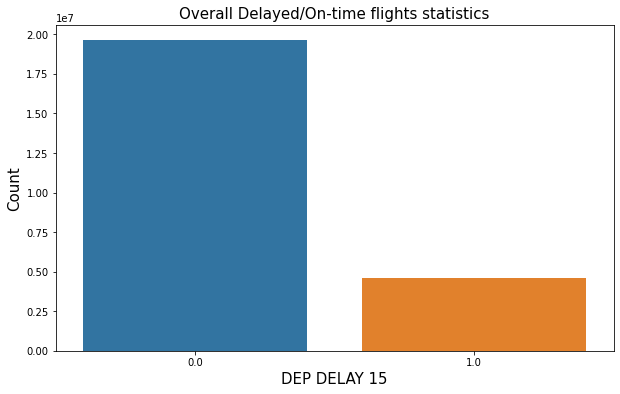

In [0]:
plt.figure(figsize = (10,6))
ax = sns.barplot(y="count(UNIQUE_ID)", x="DEP_DEL15", data=delay_count)
ax.set_ylabel('Count',fontsize=15)
ax.set_xlabel('DEP DELAY 15',fontsize=15)
ax.set_title("Overall Delayed/On-time flights statistics",fontsize=15)
plt.show()

Here we numerically and graphically observed that the total counts by month have some variation but are largely the same (even though there is greater variance delayed flight ratio) while the counts by hour chart sees much greater variability in the total counts over the course of the day.

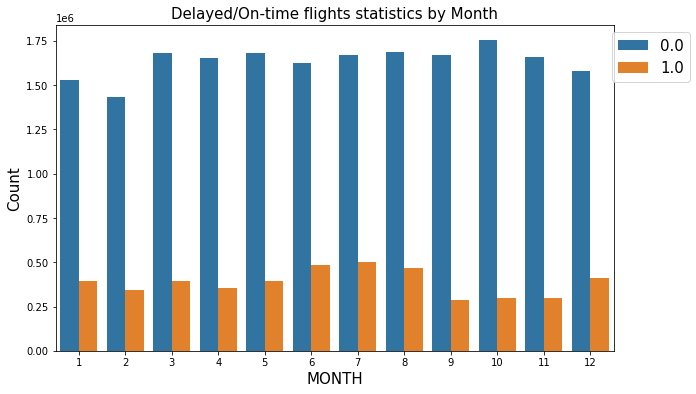

In [0]:
plt.figure(figsize = (10,6))
ax = sns.barplot(x="MONTH", y="count(UNIQUE_ID)", hue="DEP_DEL15", data=month_delay)
ax.set_xlabel('MONTH',fontsize=15);
ax.set_ylabel('Count',fontsize=15)
ax.set_title("Delayed/On-time flights statistics by Month",fontsize=15)
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper right', ncol=1, fontsize=15)
plt.show()

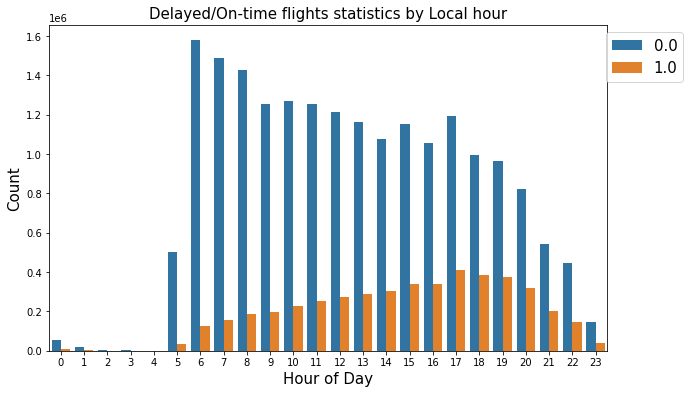

In [0]:
plt.figure(figsize = (10,6))
ax = sns.barplot(x="LOCAL_HOUR", y="count(UNIQUE_ID)", hue="DEP_DEL15", data=hour_delay)
ax.set_xlabel('Hour of Day',fontsize=15);
ax.set_ylabel('Count',fontsize=15)
ax.set_title("Delayed/On-time flights statistics by Local hour",fontsize=15)
plt.legend(bbox_to_anchor=(1.15, 1), loc='upper right', ncol=1, fontsize=15)
plt.show()

#### Correlation and distribution of the features
Finally, we looked at the correlation and distribution of each features. There are few highly correlated features, some of which we'd exect to be naturally corellated due to their physical characteristic (e.g. atmspheric pressure and sea level pressure), but most of the features have weak correlation and some skewness. 

For any regression analysis, the transformed features ideally would have the following characteristics (although we can reduce the impact of some of these given hyperparameters like regulazation in logisitc regression):
- Features are not perfectly or nearly perfectly colinear with each other
- Reject the null hypothesis that residuals are randomly distribued around zero

In our feature engineering section, we will attempt to achieve these characteristics through the following:
- We will drop highly correlated features
- We will transform skewed features (e.g. with a log transform) so that the features are closer to being normally distributed.

Again, features that have "DEST" in the name are associated with the destination airport  while the "ORIGIN" features are associated with the airport that we are trying to predict that will experience a flight delay or not.

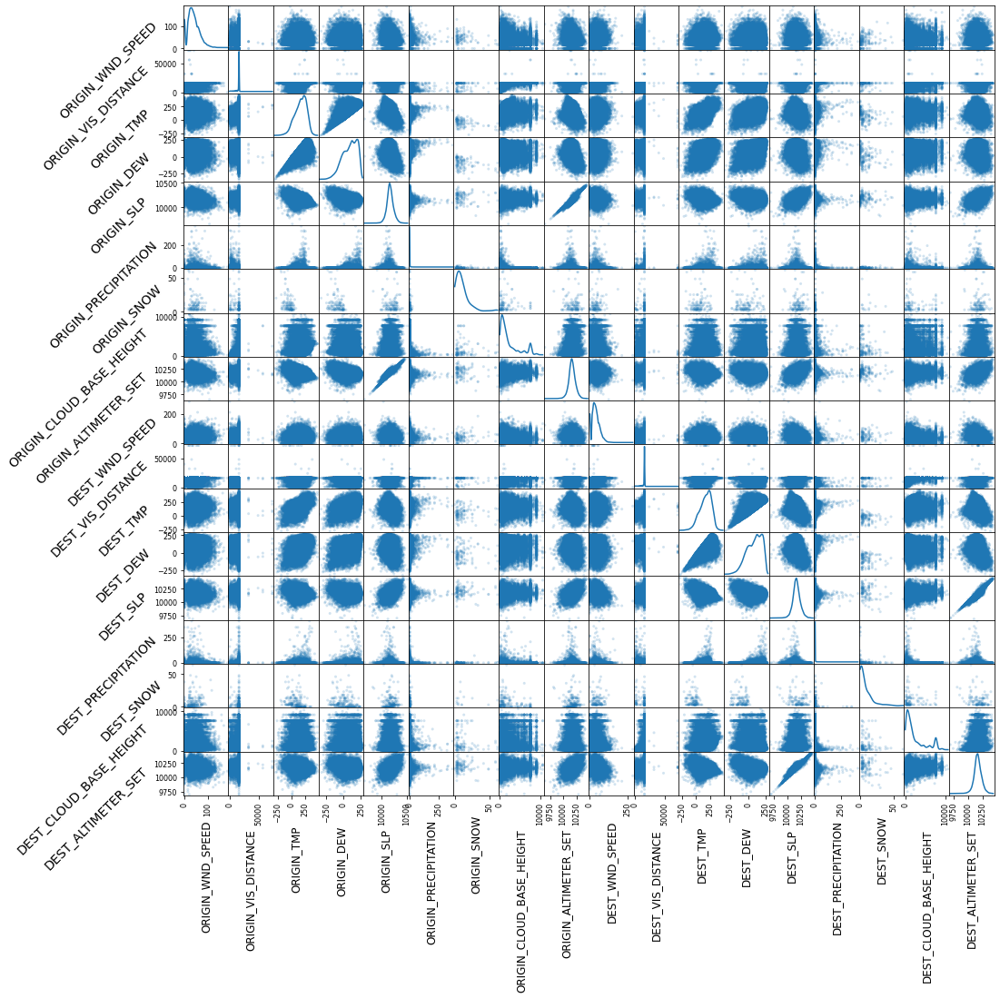

In [0]:
def EDA_Correlation_and_PDF(spark_df):
  df_master_full = spark_df
  # Categorize Features By Type
  categoricalColumns = ['OP_CARRIER', 'ORIGIN_ICAO', 'DEST_ICAO', 'DAY_OF_MONTH', 'MONTH', 'HOUR_3HRS_DEP', 'HOUR_4HRS_DEP']
  binary_or_ordinalColumns = ['DEP_DEL15', 'DEST_CIG_CAVOK', 'ORIGIN_CIG_CAVOK']
  numericCols_pre_transform = ['ORIGIN_WND_SPEED', 'ORIGIN_VIS_DISTANCE', 'ORIGIN_TMP', 'ORIGIN_DEW', 'ORIGIN_SLP', 'ORIGIN_PRECIPITATION', 'ORIGIN_SNOW', 'ORIGIN_CLOUD_BASE_HEIGHT', 'ORIGIN_ALTIMETER_SET',
                'DEST_WND_SPEED', 'DEST_VIS_DISTANCE', 'DEST_TMP', 'DEST_DEW', 'DEST_SLP', 'DEST_PRECIPITATION', 'DEST_SNOW', 'DEST_CLOUD_BASE_HEIGHT', 'DEST_ALTIMETER_SET']

  # Create a Sample for EDA Plotting
  df_master_sample = df_master_full.select(numericCols_pre_transform).sample(0.001)

  axes = pd.plotting.scatter_matrix(
      df_master_sample.select(numericCols_pre_transform).toPandas(), 
      alpha=0.2, 
      figsize=(16, 16), diagonal='kde')

  for ax in axes.flatten():
      ax.xaxis.label.set_rotation(90)
      ax.xaxis.label.set_fontsize(12)
      ax.yaxis.label.set_rotation(45)
      ax.yaxis.label.set_fontsize(14)
      ax.yaxis.label.set_ha('right')
      
df_master_full = spark.read.parquet(f"{blob_url}/master_data_full/*")
EDA_Correlation_and_PDF(df_master_full)

We observed that the `ALTIMETER_SET` and `SLP` features for both the ORIGIN and DEST airports are highly correlated and will drop one set of these features accordingly. We also will log transform the following features to try to change their distributions to be more normally distributed: `['ORIGIN_CLOUD_BASE_HEIGHT', 'DEST_CLOUD_BASE_HEIGHT', 'DEST_PRECIPITATION', 'ORIGIN_PRECIPITATION']`

## Feature engineering

Often there are multiple reasons that cause flights departure delay including air carrier delays, aircraft arriving late, National Aviation System (NAS) delays, extreme weather delays, and security delays. To showcase the effect of potential weather delays, airport specific delay and potential scheduling induced delays, we created the following features:    
- Origin/Dest Special Weather
- Scheduled Departure/Arrival Hour of the Day
- Time Between scheduled departure and previous arrival
- Target Encode the origin and destination airport     
##### ORIGIN_SPECIAL & DEST_SPECIAL:    
This feature looks at the METAR reports (REM column) and extracts special poor weather conditions reported for both the origin and destination airports. The METAR reports are a pilots and meterologist standard format for reporting weather information. The METAR reports contain various weather conditons that can affect departure delay and we extracted observation of the following weather conditions: fog, smoke, haze, thunderstorm, snow, snow grains, ice crystals and ice pellets.     
This feature was computed for both the origin and destination airports and is represented by 1 if any of the listed weather conditions are contained in the METAR report or 0 if not observed. Missing data in this feature was represented with 0 since the REM column was empty for a lot of the weather data. Replacing missing values as 0 is a safe approach as there are several other weather features that may be indicative of bad weather.     
##### DEP_TIME_HOUR & ARR_TIME_HOUR:    
This feature extracts the hour and minute of the day (local time) that the flight is scheduled to depart the origin and arrive the destination airports. Initial EDA on the dataset showed that certain times (afternoon - evening hours) showcased more delays. This feature will be used as a categorical feature and be bucketed in 4 hr blocks eg 12pm -4pm will be one catgory. There were no null values observed in this feature.     
##### TIME_BETWEEN:    
This feature extracts the time in between the schedules arrival of the previous flight and the scheduled departure time of the flight we are predicting. This is a measure of how much time the plane is scheduled to be on ground at the departure airport. The expectation is that the planes sceduled to be on ground for shorter times are more likes to be delayed. Airplanes were a previous flight on the same day was not found were labeled as null. We replaced those null values with -1 to denote no previous flight found.     
##### ORIGIN_TARGET_ENCODED & DEST_TARGET_ENCODED:    
This feature target encoded (mean encoded) the origin and destination airport names. Due to the high cardinality of the origin and dest aiport columns in the data set, we took the target encoding approch for those categorical column by replacing each unique airport with a blend of posterior probability of the target given the particular categorical value and the prior probability of the target over all the training data. There were no null values in this feature.

## Feature Transformation     
Using observations from earlier iteration on a small sample of the final dataset, we selected a list of features that would be good signals for the models predictions. After feature engineering, log transformations were done on the following columns because they showed a very strong right skewed distribution: ORIGIN_CLOUD_BASE_HEIGHT, DEST_CLOUD_BASE_HEIGHT, DEST_PRECIPITATION, ORIGIN_PRECIPITATION.

Here, we divided the `master` data set into the `train` data for prior to 2019 and the `test` data for after 2019.

In [0]:
#### Train Test Split ####

def Train_Test_Split(df_master):
  # Drop where DEP_DEL15 is null
  df_master = df_master.filter(F.col("DEP_DEL15").isNotNull())
  print('full dataset after dropping null #: ', df_master.count())
  # split train and test data
  # Train data is 2015-2018 and Test data is 2019
  train_df = df_master.filter(F.col('LOCAL_DEPTIME') < "2019-01-01T00:00:00.000")
  test_df = df_master.filter(F.col('LOCAL_DEPTIME') >= "2019-01-01T00:00:00.000")
  return train_df, test_df

train_df, test_df = Train_Test_Split(df_master)

full dataset after dropping null #: 31645627

Here we looked at the METAR reports (REM column) and extracted special poor weather conditions reported for both the origin and destination airports. Then we extracted the hour and minute of the day (local time) that the flight is scheduled to depart from the origin and arrive at the destination airports. Finally, we determined time in between the schedules arrival of the previous flight and the scheduled departure time of the flight.

In [0]:
def Feature_Engineering(train_df, test_df):
  
  ### Feature Engineering on the Training Data ###
  
  # Look at the METAR reports (REM column) and extracts special poor weather conditions.
  def METAR(df):
    # Helper funtions to extract the presence of thunderstorm, Snow/Ice and Visibility concerns (eg fog, haze, smoke, etc) from the METAR report.
    def special(rem):
      li = rem.split(" ")
      if ('FG' in li) or ('+FG' in li) or ('-FG' in li) or  \
         ('FU' in li) or ('+FU' in li) or ('-FU' in li) or  \
         ('HZ' in li) or ('+HZ' in li) or ('-HZ' in li) or  \
         ('TS' in li) or ('+TS' in li) or ('-TS' in li) or  \
         ('SN' in li) or ('+SN' in li) or ('-SN' in li) or  \
         ('SG' in li) or ('+SG' in li) or ('-SG' in li) or  \
         ('IC' in li) or ('+IC' in li) or ('-IC' in li) or  \
         ('PL' in li) or ('+PL' in li) or ('-PL' in li):
        return 1
      else:
        return 0
      
    special_udf = udf(special, IntegerType())
    return df.withColumn("ORIGIN_SPECIAL", special_udf("ORIGIN_REM")) \
             .withColumn("DEST_SPECIAL", special_udf("DEST_REM"))  
  
  # This feature extracts the hour and minute of the day (local time) that the flight is scheduled to depart the origin and arrive the destination airports
  def extractTimeFeatures(df):
    return df.withColumn("DEP_TIME_HOUR", F.when(F.length("CRS_DEP_TIME")==4, F.substring(F.col("CRS_DEP_TIME"),1,2)).otherwise(F.substring(F.col("CRS_DEP_TIME"),1,1)).cast(IntegerType()))  \
             .withColumn("DEP_TIME_MIN", F.when(F.length("CRS_DEP_TIME")==4, F.substring(F.col("CRS_DEP_TIME"),3,2)).otherwise(F.substring(F.col("CRS_DEP_TIME"),2,2)).cast(IntegerType()))  \
             .withColumn("ARR_TIME_HOUR", F.when(F.length("CRS_ARR_TIME")==4, F.substring(F.col("CRS_ARR_TIME"),1,2)).otherwise(F.substring(F.col("CRS_ARR_TIME"),1,1)).cast(IntegerType()))  \
             .withColumn("ARR_TIME_MIN", F.when(F.length("CRS_ARR_TIME")==4, F.substring(F.col("CRS_ARR_TIME"),3,2)).otherwise(F.substring(F.col("CRS_ARR_TIME"),2,2)).cast(IntegerType()))  \
             .fillna(0, ["DEP_TIME_MIN","ARR_TIME_MIN"])
  
  # Target Encoding the origin and destination airports
  def fitTargetEncoder(df, col, target):
    """
    :param df: pyspark.sql.dataframe
        dataframe to apply target mean encoding
    :param col: str list
        list of columns to apply target encoding
    :param target: str
        target column
    :return:
        dataframe with target encoded columns
    """
    target_encoded_columns_list = []
    for c in col:
        means = df.groupby(F.col(c)).agg(F.mean(target).alias(f"{c}_TARGET_ENCODED"))
        dict_ = means.toPandas().to_dict()
        target_encoded_columns = [F.when(F.col(c) == v, encoder)
                                  for v, encoder in zip(dict_[c].values(),
                                                        dict_[f"{c}_TARGET_ENCODED"].values())]
        target_encoded_columns_list.append(F.coalesce(*target_encoded_columns).alias(f"{c}_TARGET_ENCODED"))
    return df.select('*', *target_encoded_columns_list)
  

  
  # Run training dataframe to extract useful features
  train_df = METAR(train_df)
  train_df = extractTimeFeatures(train_df)
  train_df = fitTargetEncoder(train_df, col=['ORIGIN', 'DEST'], target='DEP_DEL15')
  
  # This feature is the time in between the schedules arrival of the previous flight and the scheduled departure time of the flight we are predicting.
  train_df = train_df.withColumn("DEP_DAY", F.to_date("DepTime"))  \
                     .withColumn("ARR_DAY", F.to_date("ArrTime"))
  
  def timeBetween(df):
    """
    :param df: pyspark.sql.dataframe
        dataframe to apply target mean encoding
    :return:
        dataframe with time between last flight columns
    """
    df.createOrReplaceTempView('train')

    master = spark.sql(
    """
    SELECT
      a.*,
      b.OP_CARRIER AS b_OP_CARRIER,
      b.TAIL_NUM AS b_TAIL_NUM, 
      b.ArrTime AS PREV_ARR_TIME

    FROM
      train a 
    LEFT JOIN train b
    ON a.DEP_DAY == b.ARR_DAY AND
      a.OP_CARRIER == b.OP_CARRIER AND
      a.TAIL_NUM == b.TAIL_NUM AND
      a.DepTime > b.ArrTime
      """
    )
    
    # to remove duplicate records produced by previous join. Keeps the latest weather observation for each flight
    default_time = '2020-01-01 00:00:00'
    master = master.fillna({'PREV_ARR_TIME': default_time})
    master.createOrReplaceTempView('master')
    
    master = spark.sql(
    """
    SELECT *
    FROM
      (SELECT *, MAX(master.PREV_ARR_TIME) OVER (PARTITION BY master.UNIQUE_ID) AS MAX_PREV_ARR_TIME FROM master) M
    WHERE M.PREV_ARR_TIME == M.MAX_PREV_ARR_TIME

    """
    )
    
    # Compute the difference between scheduled arrival and scheduled departures
    # Column "-1" means no flight arriving the same day 
    master = master.withColumn("SUB", F.round((F.unix_timestamp("DepTime") - F.unix_timestamp('PREV_ARR_TIME'))/60))  \
                   .withColumn("TIME_BETWEEN", F.when(F.col("SUB") < 0, -1).otherwise(F.col("SUB")))  \
                   .drop("b_OP_CARRIER","b_TAIL_NUM","MAX_PREV_ARR_TIME", "SUB")
    return master
     
  train_df = timeBetween(train_df)
  train_df = train_df.withColumn("DEP_DEL15", train_df.DEP_DEL15.cast(IntegerType())).fillna(0)
  
  ### Feature Engineer on the Testing Data ###
  
  # Run the feature engineering funtions with the exception of fitTargetEncoder(). Testing data will use transformTargetEncoder().
  # helper function to transform the test dataframe using the results of the fitTargetEncoder on the training dataframe
  def transformTargetEncoder(test_df, train_df):
      """
      :param test_df: pyspark.sql.dataframe
          dataframe to apply target mean encoding
      :param train_df: pyspark.sql.dataframe
          dataframe to extract target mean encoding from
      :return:
          dataframe with target encoded columns
      """  
      train_df.createOrReplaceTempView('train')
      # table to consolidate all the origin airports and encoding
      fit_origin = spark.sql(
      """
      SELECT 
        train.ORIGIN,
        MAX(train.ORIGIN_TARGET_ENCODED) AS ORIGIN_TE
      FROM train train
      GROUP BY train.ORIGIN
      """
      )
      # table to consolidate all the destination airports and encoding
      fit_dest= spark.sql(
      """
      SELECT 
        train.DEST,
        MAX(train.DEST_TARGET_ENCODED) AS DEST_TE
      FROM train train
      GROUP BY train.DEST
      """
      )
      #Join test set with the fitted encoding
      test_df.createOrReplaceTempView('test')
      fit_origin.createOrReplaceTempView('fo')
      fit_dest.createOrReplaceTempView('fd')
      encoded = spark.sql(
      """
      SELECT 
        test.*,
        fo.ORIGIN_TE AS ORIGIN_TARGET_ENCODED,
        fd.DEST_TE AS DEST_TARGET_ENCODED
      FROM test test
      LEFT JOIN fo fo
      ON test.ORIGIN == fo.ORIGIN
      LEFT JOIN fd fd
      ON test.DEST == fd.DEST
      """
      )
      return encoded
  
  
  test_df = METAR(test_df)
  test_df = extractTimeFeatures(test_df)
  test_df = transformTargetEncoder(test_df, train_df)
  test_df = test_df.withColumn("DEP_DAY", F.to_date("DepTime"))  \
                   .withColumn("ARR_DAY", F.to_date("ArrTime"))
  test_df = timeBetween(test_df)
  
  return train_df, test_df


Next, we selected the final set of features from the joined data that we will use for our models, drop highly colinear features as indentified in the EDA step, and log-transform the following skewed variables: `['ORIGIN_CLOUD_BASE_HEIGHT', 'DEST_CLOUD_BASE_HEIGHT', 'DEST_PRECIPITATION', 'ORIGIN_PRECIPITATION']`

In [0]:
def Feature_Transformation(spark_df):
  df_master_full = spark_df
  
  ### FEATURE SELECTION ###
  
  # Feature Selection for Model Evaluation
  # Mix of continous, categorical-nominal, and categorical-ordinal
  cols_to_keep_full = ["UNIQUE_ID", "OP_CARRIER", "DISTANCE", "ORIGIN_TARGET_ENCODED", "DEST_TARGET_ENCODED", 
                       #Date-Time Variables
                       "FL_DATE", "DAY_3HRS_DEP", "DAY_4HRS_DEP", "DAY_OF_MONTH", "MONTH", "HOUR_3HRS_DEP", "HOUR_4HRS_DEP",
                       "DEP_DAY", "ARR_DAY", "DAY_OF_WEEK", "DEP_TIME_HOUR", "ARR_TIME_HOUR", "TIME_BETWEEN",
                     
                       #Origin Variables
                       "ORIGIN_STATION", "ORIGIN_ICAO",
  #                    "ORIGIN_WND", "ORIGIN_CIG", "ORIGIN_VIS", "ORIGIN_TMP", "ORIGIN_DEW", "ORIGIN_SLP", "ORIGIN_REM", 
                       "ORIGIN_WND_SPEED", "ORIGIN_CIG_CAVOK", "ORIGIN_VIS_DISTANCE", "ORIGIN_TMP", "ORIGIN_DEW", "ORIGIN_SLP",
                       "ORIGIN_PRECIPITATION", "ORIGIN_SNOW",  "ORIGIN_CLOUD_BASE_HEIGHT", "ORIGIN_ALTIMETER_SET", "ORIGIN_SPECIAL",
                     
                       #Destination Variables
                       "DEST_STATION", "DEST_ICAO",
  #                    "DEST_WND", "DEST_CIG", "DEST_VIS", "DEST_TMP", "DEST_DEW", "DEST_SLP", "DEST_REM", 
                       "DEST_WND_SPEED", "DEST_CIG_CAVOK", "DEST_VIS_DISTANCE", "DEST_TMP", "DEST_DEW", "DEST_SLP", 
                       "DEST_PRECIPITATION", "DEST_SNOW", "DEST_CLOUD_BASE_HEIGHT", "DEST_ALTIMETER_SET", "DEST_SPECIAL",
                     
                       #Outcome (delayed or not)
                       "DEP_DEL15"]
  
  df_master_full_trimmed = df_master_full.select(cols_to_keep_full)

  #Drop columns not used for ML model and reorder so label is the first column
  #Keep FL_DATE to cross validate and split training-testing datasets
  col_to_drop = ["UNIQUE_ID", "DEST_REM", "ORIGIN_REM", "DAY_3HRS_DEP", "DAY_4HRS_DEP", "DEP_DAY", "ARR_DAY", "ORIGIN_STATION", "DEST_STATION", "ORIGIN_ICAO", "DEST_ICAO"]

  df_master_full_trimmed_v2 =  df_master_full_trimmed.drop(*col_to_drop)
  df_master_full_trimmed_v3 = df_master_full_trimmed_v2.select(["DEP_DEL15"] + [c for c in df_master_full_trimmed_v2.columns if c not in {'DEP_DEL15'}])
  
  # Categorize Features By Type
  categoricalColumns = ['OP_CARRIER', 'MONTH', 'DAY_OF_WEEK', "DEP_TIME_HOUR", "ARR_TIME_HOUR"]
  binary_or_ordinalColumns = ['DEP_DEL15', 'DEST_CIG_CAVOK', 'ORIGIN_CIG_CAVOK', 'ORIGIN_SPECIAL', 'DEST_SPECIAL']
  numericCols_pre_transform = ['ORIGIN_WND_SPEED', 'ORIGIN_VIS_DISTANCE', 'ORIGIN_TMP', 'ORIGIN_DEW', 'ORIGIN_SLP', 
                               'ORIGIN_PRECIPITATION', 'ORIGIN_SNOW', 'ORIGIN_CLOUD_BASE_HEIGHT', 'ORIGIN_ALTIMETER_SET',
                               'DEST_WND_SPEED', 'DEST_VIS_DISTANCE', 'DEST_TMP', 'DEST_DEW', 'DEST_SLP', 'DEST_PRECIPITATION',
                               'DEST_SNOW', 'DEST_CLOUD_BASE_HEIGHT', 'DEST_ALTIMETER_SET', 'DISTANCE', "ORIGIN_TARGET_ENCODED", "DEST_TARGET_ENCODED",
                               "DAY_OF_MONTH", "TIME_BETWEEN"]

  
  #### Feature Transformations###
  df_master_full_trimmed_v5_transformed = df_master_full_trimmed_v3

  #Drop linearly codependent features (SLP) and features with low counts (snow)
  df_master_full_trimmed_v5_transformed = df_master_full_trimmed_v5_transformed.drop(*['DEST_SLP','ORIGIN_SLP'])

  #Transform features so they are normally distributed
  log_transform_pre = ['ORIGIN_CLOUD_BASE_HEIGHT', 'DEST_CLOUD_BASE_HEIGHT', 'DEST_PRECIPITATION', 'ORIGIN_PRECIPITATION']#, 'ORIGIN_VIS_DISTANCE', 'DEST_VIS_DISTANCE']

  # Initialize lsit to add transformation column names to
  transform_post = []

  # Create list from raw numerical columns and delete the removed column names from list
  numericCols_pre_transform2 = numericCols_pre_transform.copy()
  for i in ['DEST_SLP','ORIGIN_SLP', 'DEST_SNOW', 'ORIGIN_SNOW']:
    numericCols_pre_transform2.remove(i) 

  # Log Transforms
  min_full = {}
  for col_name in log_transform_pre:
    numericCols_pre_transform2.remove(col_name)
    transform_post.append(col_name + '_Log10')
    
    # Add the smallest value so there are no negative numbers
    min_full[col_name]  = abs(df_master_full_trimmed_v5_transformed.agg({col_name: 'min'}).collect()[0][0]) + 0.1 #take care of log zero

    df_master_full_trimmed_v5_transformed = df_master_full_trimmed_v5_transformed\
    .withColumn(col_name + '_Log10', F.log10(F.col(col_name) + F.lit(min_full[col_name])))\
    .drop(col_name)

  numerical_cols = numericCols_pre_transform2 + transform_post

  return df_master_full_trimmed_v5_transformed, numerical_cols, binary_or_ordinalColumns, categoricalColumns


### Vectorization Pipeline

#### One Hot Encoding
We mapped categorical columns to a vector that consist of indexed values or binary variables, with at most a single one-value per row that indicates the input category index. The benefits of one hot encoding are discussed at length in this [Towards Data Science article titled "Categorical encoding using Label-Encoding and One-Hot-Encoder"](https://towardsdatascience.com/categorical-encoding-using-label-encoding-and-one-hot-encoder-911ef77fb5bd).

#### Bucketing
We bucketed the columns DEP_TIME_HOUR and ARR_TIME_HOUR to a vector that consist of indexed values for 4hr time buckets. 4 Hr buckets were used since the EDA showed similar delay to on time relationship in these buckets and preserve the number of dimensions (6 as opposed to 24) in our training vector. 

#### Scaling Features and Vector Encoding with Categorical Features

In order to minimize the impact of different features inherit units on certain model training steps (i.e when training a logistic regression model), a common technique is to scale the data so each feature becomes unitless. In this step, we explore scaling the data with the standard scaler function and the min max scaler function. The standard scaler function subtracts a feature's mean from each value and then divides it by the feature's standard deviation while the min max scaler allows a user to set the min and max value they'd like each feature to be transformed to (e.g. min value of 0 and a max value of 1). 

Through our analysis, we found the standard scaler performs slightly better with our training-test data. This function allows for either type though in case future training data performs better with a particular scaler type.

Then, we combined this newly scaled feature data with the previously one-hot encoded categorical data into a finals sparse vectorized "feature" column. The pipeline methodology for scaling and vectorizing features is discussed more in the [Medium article titled "Feature Transformer VectorAssembler in PySpark ML Feature"](https://medium.com/@nutanbhogendrasharma/feature-transformer-vectorassembler-in-pyspark-ml-feature-part-3-b3c2c3c93ee9) and from [Spark's vectorization method page](https://spark.apache.org/docs/latest/ml-features#vectorassembler).

In [0]:
def fit_DF(spark_df, numerical_cols, binary_or_ordinalColumns, categoricalColumns):
  stages = []
  #add ID column
  df_master_full_trimmed_v5_transformed = spark_df.withColumn("row_id", F.monotonically_increasing_id())

  ### One Hot Encoding ###
  # Convert Non Numeric Columns into Indexed Values
  for col in categoricalColumns:
    if col not in ["DEP_TIME_HOUR", "ARR_TIME_HOUR"]:
      cat_indexer = StringIndexer(inputCol=col, outputCol=col+"_Index", handleInvalid = "keep") #keep or skip
      #One-hot the categorical features:
      one_hot_encoder = OneHotEncoder(inputCols=[cat_indexer.getOutputCol()],outputCols=[col+'_OH'])
      stages += [cat_indexer, one_hot_encoder]
      
  # Bucket the "DEP_TIME_HOUR" & "ARR_TIME_HOUR" features
  for col in ["DEP_TIME_HOUR", "ARR_TIME_HOUR"]:
    bucketizer = Bucketizer(splits=[-1,4,8,12,16,20,25], inputCol=col, outputCol=col+"_Bucket", handleInvalid = "keep")
    stages += [bucketizer]
  ### Binary encoder for binary variables ###
  for col in binary_or_ordinalColumns:
    if col != "DEP_DEL15": #outcome column
      bin_indexer = StringIndexer(inputCol=col, outputCol=col+"_Index", handleInvalid = "keep") #keep or skip
      stages += [bin_indexer]    
  
  ### Standard scaler for the numerical features 
  # Assemble numerical features
  num_vector_assembler = VectorAssembler(inputCols = numerical_cols, outputCol = "num_features", handleInvalid = "keep") 
  stages += [num_vector_assembler]
  
  # Scale numerical features
  standard_scaler = StandardScaler(inputCol = "num_features", outputCol = "scaled_features")
  stages += [standard_scaler]
  
  ### Vector assemble all the features 
  feature_list = [feature + "_OH" for feature in categoricalColumns if feature not in ["DEP_TIME_HOUR", "ARR_TIME_HOUR"]] + ["DEP_TIME_HOUR_Bucket", "ARR_TIME_HOUR_Bucket"] + \
                 [feature + "_Index" for feature in binary_or_ordinalColumns if feature != "DEP_DEL15"] + ["scaled_features"]
  final_assembler = VectorAssembler(inputCols=feature_list, outputCol="features")
  stages += [final_assembler]
  
  pipeline = Pipeline(stages = stages)
  fit_model = pipeline.fit(df_master_full_trimmed_v5_transformed)
  
  fit_df = fit_model.transform(df_master_full_trimmed_v5_transformed)
  return fit_df, fit_model, stages


DEP_DEL15,OP_CARRIER,DISTANCE,ORIGIN_TARGET_ENCODED,DEST_TARGET_ENCODED,FL_DATE,DAY_OF_MONTH,MONTH,HOUR_3HRS_DEP,HOUR_4HRS_DEP,DAY_OF_WEEK,DEP_TIME_HOUR,ARR_TIME_HOUR,TIME_BETWEEN,ORIGIN_WND_SPEED,ORIGIN_CIG_CAVOK,ORIGIN_VIS_DISTANCE,ORIGIN_TMP,ORIGIN_DEW,ORIGIN_SNOW,ORIGIN_ALTIMETER_SET,ORIGIN_SPECIAL,DEST_WND_SPEED,DEST_CIG_CAVOK,DEST_VIS_DISTANCE,DEST_TMP,DEST_DEW,DEST_SNOW,DEST_ALTIMETER_SET,DEST_SPECIAL,ORIGIN_CLOUD_BASE_HEIGHT_Log10,DEST_CLOUD_BASE_HEIGHT_Log10,DEST_PRECIPITATION_Log10,ORIGIN_PRECIPITATION_Log10,row_id,OP_CARRIER_Index,OP_CARRIER_OH,MONTH_Index,MONTH_OH,DAY_OF_WEEK_Index,DAY_OF_WEEK_OH,DEP_TIME_HOUR_Bucket,ARR_TIME_HOUR_Bucket,DEST_CIG_CAVOK_Index,ORIGIN_CIG_CAVOK_Index,ORIGIN_SPECIAL_Index,DEST_SPECIAL_Index,num_features,scaled_features,features
1,AA,731.0,0.2161770134979564,0.15016456589561444,2015-01-01,1,1,14,13,4,11,14,-1.0,21,N,3219,0,-11,0,10271,0,0,N,16093,61,-28,0,10274,0,2.4379090355394983,3.6601157206237795,-1.0,-1.0,0,2.0,"Map(vectorType -> sparse, length -> 19, indices -> List(2), values -> List(1.0))",10.0,"Map(vectorType -> sparse, length -> 12, indices -> List(10), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 7, indices -> List(1), values -> List(1.0))",2.0,3.0,0.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 19, values -> List(21.0, 3219.0, 0.0, -11.0, 10271.0, 0.0, 16093.0, 61.0, -28.0, 10274.0, 731.0, 0.2161770134979564, 0.15016456589561444, 1.0, -1.0, 2.4379090355394983, 3.6601157206237795, -1.0, -1.0))","Map(vectorType -> dense, length -> 19, values -> List(0.8504753153778839, 1.008851941996933, 0.0, -0.10615750959228268, 45.47637670253165, 0.0, 4.838737008330064, 0.5849405120169252, -0.27021456211113476, 15.357593073564834, 1.1936174194933975, 6.414488430842553, 4.431487398566899, 0.11389377708073702, -0.015650950815875496, 1.6152358594761689, 2.393216794563024, -2.1670478262101858, -2.187761547436068))","Map(vectorType -> sparse, length -> 63, indices -> List(2, 29, 32, 38, 39, 44, 45, 47, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62), values -> List(1.0, 1.0, 1.0, 2.0, 3.0, 0.8504753153778839, 1.008851941996933, -0.10615750959228268, 45.47637670253165, 4.838737008330064, 0.5849405120169252, -0.27021456211113476, 15.357593073564834, 1.1936174194933975, 6.414488430842553, 4.431487398566899, 0.11389377708073702, -0.015650950815875496, 1.6152358594761689, 2.393216794563024, -2.1670478262101858, -2.187761547436068))"
0,EV,1167.0,0.2511724123664422,0.1974087348997743,2015-01-01,1,1,14,13,4,12,15,-1.0,46,N,16093,-11,-128,0,10227,0,31,N,11265,94,67,0,10257,0,3.881960670704853,2.2626883443016963,-1.0,-1.0,1,5.0,"Map(vectorType -> sparse, length -> 19, indices -> List(5), values -> List(1.0))",10.0,"Map(vectorType -> sparse, length -> 12, indices -> List(10), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 7, indices -> List(1), values -> List(1.0))",3.0,3.0,0.0,0.0,0.0,0.0,"Map(vectorType -> dense, length -> 19, values -> List(46.0, 16093.0, -11.0, -128.0, 10227.0, 31.0, 11265.0, 94.0, 67.0, 10257.0, 1167.0, 0.2511724123664422, 0.1974087348997743, 1.0, -1.0, 3.881960670704853, 2.2626883443016963, -1.0, -1.0))","Map(vectorType -> dense, length -> 19, values -> List(1.8629459289229837, 5.043632899209892, -0.1053506592375684, -1.2352873843465622, 45.281560172991064, 1.2589524359419635, 3.387085838491156, 0.9013837398293602, 0.6465848450516439, 15.332181443990121, 1.9055424467151778, 7.452885518221804, 5.8257040591287215, 0.11389377708073702, -0.015650950815875496, 2.5719918130624806, 1.4794897647449097, -2.1670478262101858, -2.187761547436068))","Map(vectorType -> sparse, length -> 63, indices -> List(5, 29, 32, 38, 39, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62), values -> List(1.0, 1.0, 1.0, 3.0, 3.0, 1.8629459289229837, 5.043632899209892, -0.1053506592375684, -1.2352873843465622, 45.281560172991064, 1.2589524359419635, 3.387085838491156, 0.9013837398293602, 0.6465848450516439, 15.332181443990121, 1.90554244671517

[StringIndexer_f124b2712370, OneHotEncoder_c57707d4ba6c, StringIndexer_85ec161317d7, OneHotEncoder_7055fcfc03c4, StringIndexer_5553180fb0b0, OneHotEncoder_9d2e613c7a37, Bucketizer_51ee01332e57, Bucketizer_55050cb31473, StringIndexer_86fafb966272, StringIndexer_32bbf3f962c2, StringIndexer_3f1ddc669fca, StringIndexer_fb531dae9ba6, VectorAssembler_34e0eb5aa1a3, StandardScaler_1f81d81ab440, VectorAssembler_b99470a38634]

Next, we split our data such that our new train data is the first 80% of the pre-2019 data, our test set for iteratively testing intermediate models is the last 20% of the pre-2019 data, and our validation set is the post 2019 data which we reserve for our final model test. The use of the last 20% for testing is necessary to preserve the time series nature of the data set. The Validation set was the unseen data not used to compute the features.

In [0]:
def train_test_val_split(train_df, test_df):
  """Split Data into Train, Test, and Validation Sets """
  
  #Split DFs into training, testing, and validation data
  
#   .withColumn("FL_DATE", F.to_date("FL_DATE"))\
  df_full_to_split = train_df.withColumn("rank", F.percent_rank().over(Window.partitionBy().orderBy("FL_DATE")))
  
  training_data_full = df_full_to_split.where("rank <= .8").drop("rank") #first 80% of pre 2019 data
  testing_data_full =  df_full_to_split.where("rank > .8").drop("rank") #last 20% of pre 2019 data

  validation_data_full = test_df #2019 data to be held out until the very last model
  validation_data_full = validation_data_full.withColumn('row_id', F.monotonically_increasing_id())
#   df_full_to_split = train_df#.filter(F.to_date("FL_DATE") < F.lit('2019-01-01'))
#   training_data_full, testing_data_full = df_full_to_split.randomSplit([0.8, 0.2], seed=24)
#   validation_data_full = test_df#.filter(F.to_date("FL_DATE") >= F.lit('2019-01-01'))

  training_data_full_count = training_data_full.count()
  testing_data_full_count = testing_data_full.count()  
  validation_data_full_count = validation_data_full.count()

  print("\nFull Data:")
  print("\ttraining data count:", (training_data_full_count, 
        round(training_data_full_count/(training_data_full_count + testing_data_full_count + validation_data_full_count),2)), 
        "\n\ttesting data count:", (testing_data_full_count,
        round(testing_data_full_count/(training_data_full_count + testing_data_full_count + validation_data_full_count),2)),
        "\n\tvalidation data count:", (validation_data_full_count,
        round(validation_data_full_count/(training_data_full_count + testing_data_full_count + validation_data_full_count),2)))

  return training_data_full, testing_data_full, validation_data_full

training_data_full, testing_data_full, validation_data_full = train_test_val_split(test, val)

In [0]:
def one_hot_encoder(spark_df, numerical_cols, binary_or_ordinalColumns, categoricalColumns):
  #add ID column
  df_master_full_trimmed_v5_transformed = spark_df.withColumn("row_id", F.monotonically_increasing_id())

  # Assumption - fill all the NA's with zeros. Necessary for logistic regression
  df_master_full_trimmed_v6 = df_master_full_trimmed_v5_transformed.na.fill(value=0.0)

  ### One Hot Encoding ###
  
  # Convert Non Numeric Columns into Indexed Values
  for col in categoricalColumns + binary_or_ordinalColumns:
    if col != "DEP_DEL15": #outcome column
      qualification_indexer = StringIndexer(inputCol=col, outputCol=col+"_Index", handleInvalid = "keep") #keep or skip

      #Fits a model to the input dataset with optional parameters.
      df_master_full_trimmed_v6 = qualification_indexer.fit(df_master_full_trimmed_v6).transform(df_master_full_trimmed_v6)
  
  df_master_full_trimmed_v7 = df_master_full_trimmed_v6

  # One-Hot Encode the New Indexed Values
  onehot_feature_list = []
  for col in categoricalColumns:
    onehot_feature_list.append(col+"_Vector")
    onehotencoder_vector = OneHotEncoder(inputCol=col+"_Index", outputCol=col+"_Vector", handleInvalid = "keep") # keep or error
    df_master_full_trimmed_v7 = onehotencoder_vector.fit(df_master_full_trimmed_v7).transform(df_master_full_trimmed_v7)

  return df_master_full_trimmed_v7, onehot_feature_list


# Run Algorithm (copy to Main at the end)
# df_transformed2, onehot_feature_list = one_hot_encoder(df_transformed, numerical_cols, binary_or_ordinalColumns, categoricalColumns)

training_df_transformed, onehot_feature_list = one_hot_encoder(training_data_full, numerical_cols, binary_or_ordinalColumns, categoricalColumns)

testing_df_transformed, _ = one_hot_encoder(testing_data_full, numerical_cols, binary_or_ordinalColumns, categoricalColumns)

validation_df_transformed, _ = one_hot_encoder(validation_data_full, numerical_cols, binary_or_ordinalColumns, categoricalColumns)




Full Data:
	training data count: (19359, 0.61) 
	testing data count: (4855, 0.15) 
	validation data count: (7399, 0.23)

In [0]:
# Helper Function 1 - Vector Assembler
def vector_assembler_transform(training_data, testing_data, validation_data = None, inputcols_ = numericCols, handleInvalid_ = "keep"):
  """combine numerical features into row vectors"""
    
  # Initialize vector assembler class
  vector_assembler = VectorAssembler(inputCols = inputcols_, outputCol = "scaled_features", handleInvalid = handleInvalid_)
  
  # Combine numerical features into single row vector
  temp_train = vector_assembler.transform(training_data)
  temp_test = vector_assembler.transform(testing_data)  
  if validation_data is not None:
    temp_val = vector_assembler.transform(validation_data)
    return temp_train, temp_test, temp_val
  return temp_train, temp_test, None

# Helper Function 2 - Standard Scaler
def standard_scaler_with_vectorization(training_data, testing_data, validation_data = None, inputcols_ = numericCols, handleInvalid_ = "keep"):
  """scale numerical row vectors by subtracting the mean and normalizing by the std dev"""
  
  # Call UDF to combine numerical features into a single row vector
  train, test, val = vector_assembler_transform(training_data, testing_data, validation_data, inputcols_, handleInvalid_)
  
  # Initialize Standard Scaler class
  standard_scaler = StandardScaler(inputCol = "scaled_features", outputCol = "scaled")
  
  # Scale Training, Testing, and Validation Data
  train_scaler = standard_scaler.fit(train).transform(train)
  test_scaler = standard_scaler.fit(test).transform(test)
  if validation_data is not None:
    val_scaler = standard_scaler.fit(val).transform(val)
    return train_scaler, test_scaler, val_scaler
  return train_scaler, test_scaler, None

# Helper Function 3 - Min Max Scaler
def minmax_scaler_with_vectorization(training_data, testing_data, validation_data = None, 
                                     inputcols_ = numericCols, handleInvalid_ = "keep"):
  """scale row vectors by setting the min and max values"""
  
  # Combine numerical features into a single row vector
  train, test, val = vector_assembler_transform(training_data, testing_data, validation_data, inputcols_, handleInvalid_)
  
  # Initialize MinMax Scaler class
  minmax_scaler = MinMaxScaler(inputCol = "scaled_features", outputCol = "scaled") #defaults assumed to be a min of 0 and max of 1
  
  # Scale Training, Testing, and Validation Data
  train_scaler = minmax_scaler.fit(train).transform(train)
  test_scaler = minmax_scaler.fit(test).transform(test)
  if validation_data is not None:
    val_scaler = minmax_scaler.fit(val).transform(val)
    return train_scaler, test_scaler, val_scaler
  return train_scaler, test_scaler, None

# Helper Function 4 - Combine categorical and scaled features
def combine_vectors(train_scaler, test_scaler, val_scaler = None,
                    handleInvalid_ = "keep", 
                    onehotcols = onehot_feature_list, 
                    ordcols = binary_or_ordinalColumns):
  """Combine all one hot coded features, scaled numerical features, and boolean features into one vector list"""
  
  # Create list of combined vector names
  inputvectCols = ["scaled"] + onehotcols + [i + "_Index" for i in ordcols if i != 'DEP_DEL15']
  
  # Initialize vector assembler class
  vector_assembler_total =  VectorAssembler(inputCols = inputvectCols, outputCol = "features", handleInvalid = handleInvalid_)
  
  # Transform training, testing, and validation sets
  train_vect_feature = vector_assembler_total.transform(train_scaler)
  test_vect_feature = vector_assembler_total.transform(test_scaler)
  if val_scaler is not None:
    val_vect_feature = vector_assembler_total.transform(val_scaler)
    return train_vect_feature, test_vect_feature, val_vect_feature
  return train_vect_feature, test_vect_feature, None

# Call the helper functions and run the whole pipeline
def scale_data_pipeline(training_data, testing_data, validation_data = None,
           inputcols_ = numericCols, handleInvalid_ = "keep",
           scaler_method = "standard",
           onehotcols = onehot_feature_list, 
           ordcols = binary_or_ordinalColumns): 
  """Choose Scalar method to continue with and call all the helper scaler functions"""
  
  # Standard Scalar
  if scaler_method.lower() == "standard":
    train_scale_tmp, test_scale_tmp, val_scale_tmp = standard_scaler_with_vectorization(training_data, testing_data, validation_data,
                                                                                        inputcols_, handleInvalid_)
  
  # Min Max Scalar
  else:
    train_scale_tmp, test_scale_tmp, val_scale_tmp = minmax_scaler_with_vectorization(training_data, testing_data, validation_data,
                                                                                        inputcols_, handleInvalid_)
  # Combine Scaled Features with One Hot Encoding Features and Binary Features
  train_scale_tmp, test_scale_tmp, val_scale_tmp = combine_vectors(train_scale_tmp, test_scale_tmp, val_scale_tmp, handleInvalid_)

  return train_scale_tmp, test_scale_tmp, val_scale_tmp
  
# Scale the full data - can toggle between standard scalar and min-max scalar
# Run Algorithm (copy to Main at the end)
train_scaled_full, test_scaled_full, val_scaled_full = scale_data_pipeline(
  training_df_transformed, testing_df_transformed, validation_df_transformed,
  inputcols_ = numericCols, handleInvalid_ = "keep",
  scaler_method = "standard",
  onehotcols = onehot_feature_list, ordcols = binary_or_ordinalColumns) 



### Create Evaluation Metric UDF

Custom function used to report a model's true positve (tp), true negative (tn), false negative (fn), and false positive (fp) results as well as the accuraccy, precision, recall, and F1 scores.  

$$\textbf{Accuracy} = \frac{tp + tn}{(tp + tn + fn + fp)}  $$
$$\textbf{Precision} = \frac{tp}{(tp+fp)}  $$
$$\textbf{Recall} = \frac{tp}{(tp+fn)}  $$
$$\textbf{F1-score} = \frac{2 \times \text{precision} \times \text{recall}}{(\text{precision + recall})}$$

In [0]:
# Custom class for defining ML performance
def classification_report(spark_sql_df, report_title = "Model Results", label = "DEP_DEL15", prediction = "prediction"):
  '''print classifcation accuracy, precision, recall, and f1 score for a spark sql data frame given the label and prediction column name'''
  
  tp = spark_sql_df.filter((F.col(label) == F.col(prediction)) & ((F.col(label) == "1") | (F.col(label) == 1))).count()
  tn = spark_sql_df.filter((F.col(label) == F.col(prediction)) & ((F.col(label) == "0") | (F.col(label) == 0))).count()
  fn = spark_sql_df.filter((F.col(label) != F.col(prediction)) & ((F.col(label) == "1") | (F.col(label) == 1))).count()
  fp = spark_sql_df.filter((F.col(label) != F.col(prediction)) & ((F.col(label) == "0") | (F.col(label) == 0))).count()
  total = (tp + tn + fn + fp)
  
  print(report_title)
  print("tp:", tp/total, "tn:", tn/total, "fn:", fn/total, "fp:", fp/total)
  print("tp:", tp, "tn:", tn, "fn:", fn, "fp:", fp)

  #Avoid divide by zero logic. If result is negative, indicates there were no counts in that denom for that score
  test_accuracy =  round((tp + tn)/total,4)
  if tp == 0 and fp == 0:
    test_precision = "No Delayed Predictions"
  else:  
    test_precision = round(tp / (tp + fp),4)
  if tp == 0 and fn == 0:
    test_recall = "No Correct Delayed Predictions or Incorrect On-time Predictions"
  else:
    test_recall = round(tp / (tp + fn),4)
  if type(test_precision) == str or type(test_recall) == str: 
    test_f1 = "NA"
  else:
    test_f1 = round(2 * test_precision * test_recall / (test_precision + test_recall),4)

  print('Accuracy: {}\nPrecision: {}\nRecall: {}\nF1-score: {}'.format(test_accuracy, test_precision, test_recall, test_f1))
  print('------------------------------\n')

### Model 0 - Simple model

When evaluating our intermediate and final model, we'd wanted to know what the results for a "simple model" (i.e. a model that only predicts the more popular class) would look like. As expected, the simple model is accurate around 80% of the time if it only predicts a flight will be on time. While this score may seem decent upon first glance, this approach fails to predict any instances where a flight would be delayed. As a customer or an airline company, this is not very useful as no productive travel or business decisions can be made based on this information. Our goal for the remainder of the models is to greatl boost the number of true positive predictions (i.e. boost the precision, recall, and F1 score) without penalizing the accuray of the model too greatly.

In [0]:
def baseline_performance(test_scaled_full_weighted, val_scaled_full_weighted):
  """The classification scores associated with a model that always predicts the greater estimated class"""
  labels_and_preds_base = test_scaled_full_weighted.withColumn("prediction", F.lit(0.0))
  classification_report(labels_and_preds_base, "No Learning Classifier Results:")
  return labels_and_preds_base

# Run Algorithm (copy to Main at the end)
labels_and_preds_base = baseline_performance(test_scaled_full, val_scaled_full)


No Learning Classifier Results:
tp: 0.0 tn: 0.8159816398915084 fn: 0.18401836010849154 fp: 0.0
tp: 0 tn: 3911 fn: 882 fp: 0
Accuracy: 0.816
Precision: No Delayed Predictions
Recall: 0.0
F1-score: NA
------------------------------

### Address Unbalanced Labels

During some inital model training steps, results often had good accuracy scores (i.e. +80%) but poor F1 metrics resulting in a model than practically mimicked the "simple model" performance in which it predicts almost all of the flights would arrive on time. We found this was due to the fact that there was such a significant imbalance in the delayed vs on time label counts. To account for this, we created a function that would determine class weights that could be used as an input in PySpark's ML packages.

In [0]:
def model_weights(train_scaled_full, test_scaled_full, val_scaled_full):
  """Determine the model weights to be applied for unbalanced labeled datasets and add weights as a feature to the train and test data"""

  # Drop all features that were vectorized
  train_scaled_full = train_scaled_full.select("row_id", "DEP_DEL15", "features", "FL_DATE")
  test_scaled_full = test_scaled_full.select("row_id", "DEP_DEL15", "features", "FL_DATE")
  val_scaled_full = val_scaled_full.select("row_id", "DEP_DEL15", "features", "FL_DATE")
  
  
  # come up with weights for ML models
  y_collect_full = train_scaled_full.select("DEP_DEL15").groupBy("DEP_DEL15").count().collect()
  unique_y_full = [x["DEP_DEL15"] for x in y_collect_full]
  total_y_full = sum([x["count"] for x in y_collect_full])
  unique_y_count_full = len(y_collect_full)
  bin_count_full = [x["count"] for x in y_collect_full]

  class_weights_spark_full = {i: ii for i, ii in zip(unique_y_full, total_y_full / (unique_y_count_full * np.array(bin_count_full)))}
  print("Calculated Class Weights:", class_weights_spark_full) #{0.0: 0.6, 1.0: 2.6}

  #add in weight columns
  mapping_expr_full = F.create_map([F.lit(x) for x in chain(*class_weights_spark_full.items())])
  train_scaled_full = train_scaled_full.withColumn("weight", mapping_expr_full.getItem(F.col("DEP_DEL15")))
  test_scaled_full = test_scaled_full.withColumn("weight", mapping_expr_full.getItem(F.col("DEP_DEL15")))
  val_scaled_full = val_scaled_full.withColumn("weight", mapping_expr_full.getItem(F.col("DEP_DEL15")))

  return train_scaled_full, test_scaled_full, val_scaled_full

# Run Algorithm (copy to Main at the end)
train_scaled_full_weighted, test_scaled_full_weighted, val_scaled_full_weighted = model_weights(training_data_full, testing_data_full, validation_data_full)

Calculated Class Weights: {0: 0.616220166922056, 1: 2.651089665597061}

### Algorithm Theory

Team 5 has explored he data set, features and decided to go with a binary classification algorithm, which will get the outcome as a probability of dependant variables. It is called a generalized linear model not because the estimated probability of the response event is linear, but because the logit of the estimated probability response is a linear function of the parameters.
$$ logit(p_i) = \frac{p_i}{1-p_i} = \beta_0 + \beta_1X_1 + \beta_2X_2 + \beta_pX_p$$

To find \\(\beta_0 \\) and \\(\beta_1 \\) that results in a p(X) that most accurately classifies all the observed data points – that is, those that belong to the positive class have a probability as close as possible to 1 and those that belong to the negative class have a probability as close as possible to 0.

\\(L = -log(\prod_{i=+}{p(X_i)} * \prod{1 - p(X_j)})\\)

Other algorithms applied are based on a tree based approach (both Decision tree and Random Forest). Decision trees are built using a heuristic called recursive partitioning. This approach is also commonly known as divide and conquer because it splits the data into subsets, which are then split repeatedly into even smaller subsets, and so on and so forth until the process stops when the algorithm determines the data within the subsets are sufficiently homogenous, or another stopping criterion has been met.
$$ E(T,X) = \sum_{c \in X}P(c)E(c)$$

Toy Data: 
  
             Play Golf
  
  |Yes |No|  |
----|-----|-----|
Sunny |3|2|5
Overcast |4|0|4
Rainy |2|3|5
|||14

In the toy data set we are considering if playing golf can be decided based on the outlook(Sunny, Rainy and Overcast). We use an Entropy using the frequency table of two attributes.  The final decision can be concluded as below.

 E(PlayGolf, Outlook) =  P(Sunny) * E(3,2) + P(Overcast) * E(4,0) +  P(Rainy) * E(2,3) = (5/14) * 0.971 + (4/14) * 0 + (5/14) * .971 = 0.693 = 0.693
 
 Similar to the above example the weather data features which resulted the decision boundary for flight delays are measured using divide and conquer process.

### Cluster availability Issues

At this point in our analysis, we were unfortunately unable to run our cross validation, random forest, and final ensemble model due to Spark Job resource constraints for the MIDS class. We spent the better part of Sunday afternoon on 12/06 and Monday afternoon on 12/07 trying to run our final models but was unable to do so.

In order to proceed with the rest of the analysis and write up, we show the results that we had previously run with a small sample of the dataset (i.e. ~0.01% of the intial data randomly sampled). Below we provide a summary of our evaluation metrics for scenarios where we were able to train and test our models on both the full data table and the smaller sample. With the exception Recall score for the Small LR, all of the scores were higher for the respective models. In the future, we'd hope to be able to finish retraining our cross validation, random forest, and ensemble model with the larger data set. 


 Results|Large LR |Small LR| Large DT | Small DT |
----|----|-----|-----|-----|
Accuracy |0.63|0.53|0.64|0.58
Precision |0.30|0.25|0.30|0.24
Recall |0.64|0.74|0.58|0.56
F1-score|0.40|0.37|0.39|0.33


<img src="Screen Shot 2021-12-05 at 11.37.54 PM.png">  </img>

### Available Results with the full dataset
Here we present the results the logistic regression and decision tree functions with the full dataset.

### Base Model 1 - Logistic Regression

For the first baseline model, we chose to implement a logistic regression model since it is easy to implement, efficient to train and it scales well. It can help us determine feature importance and the relationship between features by measuring the coefficient size and direction of association. However, logistic regression does come with some overhead. The feature would need to be scaled before applying the model - unlike in decision tree models where one can utilize without feature scaling.

In the w261 - week 7 lecture, we learned about how the ridge and lasso regularization parameter are useful when training a regression model as non-regularized models often overfit for the noise and do not generalize very well outside the training set. In the regularization expansion of  logistic regression, the equation loss equation we want to minimize for logistic regresion with its hyperparameters becomes the following, where the L is the Loss function for normal logistic regression (described in the algorithm theory), \\(\beta_1 \\) is the penaly vector (shown in the algorithm theory), \\(\lambda \\) is the regularization strength , and \\(\alpha \\) is the elastinet parameter (i.e. the ratio of ridge to lasso logistic regression).

\\(L + \lambda * (1-\alpha) \times \sum{[\beta_1^2 + \alpha \sum{|\beta_1|}}] \\)

In Spark, the Logistic Regression parameter regParam refers to the constant that multiplies the penalty term while the parameter elasticNetParam is the a mixing parameter that specifies the ratio of the ridge and lasso penalties.

As such, we previously ran the commented out nested for loop with a sample of the dataset to determine which combination of tuned parameters resulted in the best model performance. We found that a regulazation parameter of 0.3 and fully ridge regularization elasticnet parameter resulted in the best model performance with when using our training and testing tables.

For each model, we generate the class predictions for both the test set (last 20% of the pre 2019 data) and the validation set (post 2019 data) although we only look at the results for the test set until we run our final model on the validation set. The reason for running intermediate transforms on the validation data is that these transformed predictions serve as the input for our final ensemble model.

In [0]:
def logistic_regression(train, test, val, reg = 0.0, elasticNet = 0.0):
  """Train and fit a logistic regression model. Include the regularization and elasticnet parameters."""
  
  # Hypertunning proxy - uncomment to loop through.
  # for elasticNet in [0, 0.5, 1]:
  #   for reg in np.linspace(0,1,11):
  lr = LogisticRegression(featuresCol = 'features', labelCol = 'DEP_DEL15',
                          weightCol="weight", maxIter = 50, 
                          regParam=reg, elasticNetParam=elasticNet)
  lrModel = lr.fit(train)
  labels_and_preds_lr = lrModel.transform(test)
  labels_and_preds_lr_val = lrModel.transform(val)

  # Uncomment for hyperparameter tunning along with the for loop
    # print("\nreg:", reg, "elisticnet:", elasticNet)
    # labels_and_preds_3m_lr.select('prediction', 'DEP_DEL15').summary().show()

  classification_report(labels_and_preds_lr, "Base Logistic Regression Results:")
  return labels_and_preds_lr, labels_and_preds_lr_val

# Run Algorithm (copy to Main at the end)
labels_and_preds_lr, labels_and_preds_lr_val = logistic_regression(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       reg = 0.3, elasticNet = 0.0)

Base Logistic Regression Results:
tp: 0.1262127497630749 tn: 0.5018225723776001 fn: 0.07237481087828712 fp: 0.29958986698103796
tp: 610887 tn: 2428890 fn: 350304 fp: 1450056
Accuracy: 0.628
Precision: 0.2964
Recall: 0.6356
F1-score: 0.4043
------------------------------

### Base Model 2 - Decision Trees

As discussed in the w261 week 11 lecture, decision trees (DT) have many advantages compared with other learners, including:
- DT can handle numeric, categorical, and ordinal features
- No data preprocessing, standardization, nor scaling is required
- Handle missing values naturally
- Are highly scalable as it distributes its learners graphically (similar to PageRank) via information gain per tree layer
- Has inherent variable selection via the single node - information gain process
- Has very few hyperparameters to tune

Although we have already scaled our data and one-hot encode our categorical features, we do not expect this will hurt the DT model performance compared to if we had used the untransformed data. When running this model on our sampled data set, we found that the gini impurity paramter performs slighly better than en entropy parameter.

In [0]:
def decision_tree_classifier(train, test, val, impurity_type = "gini"):
  """decision tree classfier and model performance report. Default impurity type is the gini parameter."""
  # Tune impurity type:
  # for impurity_type in  ["entropy", "gini"]:
  impurity_type = "gini" #found gini impurity had improved performance
  dtc = DecisionTreeClassifier(featuresCol='features',labelCol='DEP_DEL15', impurity=impurity_type, weightCol="weight")#, maxDepth = 10)

  dtcModel = dtc.fit(train)
  labels_and_preds_dt = dtcModel.transform(test)
  labels_and_preds_dt_val = dtcModel.transform(val)

  classification_report(labels_and_preds_dt, "Base Decision Tree Results:")
  return labels_and_preds_lr, labels_and_preds_lr_val

# Run Algorithm (copy to Main at the end)
labels_and_preds_dt, labels_and_preds_dt_val = decision_tree_classifier(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       impurity_type = "gini") 

Base Decision Tree Results:
tp: 0.11442981882537623 tn: 0.5280092278379723 fn: 0.08415774181598579 fp: 0.27340321152066566
tp: 553856 tn: 2555637 fn: 407335 fp: 1323309
Accuracy: 0.6424
Precision: 0.295
Recall: 0.5762
F1-score: 0.3902
------------------------------

In evaluating our model performances, we decided to focus on the model's accuracy and recall as the primary evaluation metrics as these show how often our model was correct in general as well how often our model was correct when a flight was actually delayed (which is of high business significance). In comparing our first two models, our loigistic regression model achieved a slighly lower model accuracy compared to our decision tree model (0.63 vs 0.64), but achieved a slightly higher recall score (0.64 vs 0.58). This further emphasises our decision to try more advanced learners like ensemble models to stack the benefits from different model runs.

### Continued Analysis with the small sampled dataset
Here we present the results the logistic regression and decision tree functions with the smaller sampled dataset, as well as the cross validation - logistic regression model, the random forest model, and ensemble model results with the small sample dataset.

In [0]:
def logistic_regression(train, test, val, reg = 0.0, elasticNet = 0.0):
  """Train and fit a logistic regression model. Include the regularization and elasticnet parameters."""
  
  # Hypertunning proxy - uncomment to loop through.
  # for elasticNet in [0, 0.5, 1]:
  #   for reg in np.linspace(0,1,11):
  lr = LogisticRegression(featuresCol = 'features', labelCol = 'DEP_DEL15',
                          weightCol="weight", maxIter = 50, 
                          regParam=reg, elasticNetParam=elasticNet)
  lrModel = lr.fit(train)
  labels_and_preds_lr = lrModel.transform(test)
  labels_and_preds_lr_val = lrModel.transform(val)

  # Uncomment for hyperparameter tunning along with the for loop
    # print("\nreg:", reg, "elisticnet:", elasticNet)
    # labels_and_preds_3m_lr.select('prediction', 'DEP_DEL15').summary().show()

  classification_report(labels_and_preds_lr, "Base Logistic Regression Results:")
  return labels_and_preds_lr, labels_and_preds_lr_val
  
# Run Algorithm (copy to Main at the end)
labels_and_preds_lr, labels_and_preds_lr_val = logistic_regression(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       reg = 0.3, elasticNet = 0.0)

Base Logistic Regression Results:
tp: 0.13898305084745763 tn: 0.39361914257228314 fn: 0.04865403788634098 fp: 0.4187437686939183
tp: 697 tn: 1974 fn: 244 fp: 2100
Accuracy: 0.5326
Precision: 0.2492
Recall: 0.7407
F1-score: 0.3729

Here we see that our accuracy of our base logistic regression model is fairly poor compared to our large dataset. Interestingly, our recall score actually went up compared with the larger dataset, indicating there were fewer false negative predictions relative to the number of positive predictions.

In [0]:
def decision_tree_classifier(train, test, val, impurity_type = "gini"):
  """decision tree classfier and model performance report. Default impurity type is the gini parameter."""
  # Tune impurity type:
  # for impurity_type in  ["entropy", "gini"]:
  impurity_type = "gini" #found gini impurity had improved performance
  dtc = DecisionTreeClassifier(featuresCol='features',labelCol='DEP_DEL15', impurity=impurity_type, weightCol="weight")#, maxDepth = 10)

  dtcModel = dtc.fit(train)
  labels_and_preds_dt = dtcModel.transform(test)
  labels_and_preds_dt_val = dtcModel.transform(val)

  classification_report(labels_and_preds_dt, "Base Decision Tree Results:")
  return labels_and_preds_lr, labels_and_preds_lr_val

# Run Algorithm (copy to Main at the end)
labels_and_preds_dt, labels_and_preds_dt_val = decision_tree_classifier(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       impurity_type = "gini") 
  

Base Decision Tree Results:
tp: 0.10468594217347957 tn: 0.47916251246261216 fn: 0.08295114656031904 fp: 0.33320039880358926
tp: 525 tn: 2403 fn: 416 fp: 1671
Accuracy: 0.5838
Precision: 0.2391
Recall: 0.5579
F1-score: 0.3347

The accuracy and recall for our small dataset random forest model are also poor compared to our larger dataset. To try to improve the performances of both of these models.

## Algorithm Implementation

After observing the results from our base models, we then wanted to improve our model performance and robustness, namley via cross validation and ensemble techniques. They accomplish this by reducing the variance component of the prediction error by adding bias. Unfortunately, this improved performance often results in greatly increase computational cost and complexity.

### Model 3 - Cross Validation  
For the time series data cross validation, we took a rolling basis data split in which a small subset of data was trained sequentially from the beginning. The later data points were then estimated and subqequently checked for accuracy. The same estimated points were then included in the next training set and subsequent data points were forecasted. In this cross validation, we divided training set into 4 portions. The first round performed training on the first portion and validation on the second portion. The second round performed training for the first and the second portions and validation on the third portion and so forth. Using this method, we successively considered each portion as the validation set and assign all previous data into the training set. With this time-series cross-validation approach, we tested predictive performance at numerous correlated time steps, resulting in boosted the model performance.

In [0]:
def cross_validation_lr(train_scaled_full_weighted, reg = 0.0, elasticNet = 0.0):
  df_train_full_rank_ft = train_scaled_full_weighted.withColumn("rank", F.percent_rank().over(Window.partitionBy().orderBy("FL_DATE")))
  nfold = 4

  lr = LogisticRegression(featuresCol = 'features', labelCol = 'label', #''DEP_DEL15',
                        weightCol="weight", maxIter = 50, 
                        regParam=reg, elasticNetParam=elasticNet)

  grid = ParamGridBuilder() \
          .addGrid(lr.regParam, [0.5, 0.1, 0.01, 0.001, 0.0001]).build()

  evaluator = BinaryClassificationEvaluator()
  cv = CrossValidator(estimator = lr, estimatorParamMaps = grid, evaluator = evaluator, parallelism = 2) 

  for i in range(nfold-1):
    temp_train = df_train_full_rank_ft\
      .where("rank <= "+str((i+1)/nfold))\
      .drop("rank")\
      .select(["DEP_DEL15","features","weight"])

    temp_validate = df_train_full_rank_ft.where("rank > "+str((i+1)/nfold))\
      .where("rank <= "+str((i+2)/nfold)).drop("rank")\
      .select(["DEP_DEL15","features","weight"])

    print("train: up to ",(i+1)/nfold)
    print("validate: up to ",(i+2)/nfold)

    temp_train = temp_train.withColumn("label", F.col("DEP_DEL15").cast("int")).select(["label","features","weight"])
    temp_validate = temp_validate.withColumn("label", F.col("DEP_DEL15").cast("int")).select(["label","features","weight"])

    cvModel = cv.fit(temp_train).bestModel
    labels_and_preds_lr_cv = cvModel.transform(temp_validate).select(["label", "prediction", "probability", "features"])

#     print(evaluator.evaluate(cvModel.transform(temp_validate)))
    classification_report(labels_and_preds_lr_cv, "Cross Validation Iteration Results")
  
  labels_and_preds_lr_cv_val = cvModel.transform(temp_validate).select(["label", "prediction", "probability", "features"])
  
  return labels_and_preds_lr_cv, labels_and_preds_lr_cv_val
    
# Run Algorithm (copy to Main at the end)
labels_and_preds_lr_cv, labels_and_preds_lr_cv_val = cross_validation_lr(train_scaled_full_weighted, reg = 0.0, elasticNet = 0.0) 

labels_and_preds_lr_cv = labels_and_preds_lr_cv.withColumnRenamed("label", "DEP_DEL15")
labels_and_preds_lr_cv_val = labels_and_preds_lr_cv_val.withColumnRenamed("label", "DEP_DEL15")


train: up to 0.25
validate: up to 0.5
MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Cross Validation Iteration Results
tp: 0.09995860927152318 tn: 0.5380794701986755 fn: 0.08774834437086093 fp: 0.2742135761589404
tp: 483 tn: 2600 fn: 424 fp: 1325
Accuracy: 0.638
Precision: 0.2671
Recall: 0.5325
F1-score: 0.3558
------------------------------

train: up to 0.5
validate: up to 0.75
MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Cross Validation Iteration Results
tp: 0.10612668743509865 tn: 0.5190031152647975 fn: 0.08701973001038421 fp: 0.28785046728971964
tp: 511 tn: 2499 fn: 419 fp: 1386
Accuracy: 0.6251
Precision: 0.2694
Recall: 0.5495
F1-score: 0.3615
------------------------------

train: up to 0.75
validate: up to 1.0
MLlib will automatically track trials in MLflow. After your tuning fit() call has completed, view the MLflow UI to see logged runs.
Cross Validation Iteration Results
tp: 0.12243629583592293 tn: 0.49285270354257305 fn: 0.07188730060078724 fp: 0.3128237000207168
tp: 591 tn: 2379 fn: 347 fp: 1510
Accuracy: 0.6153
Precision: 0.2813
Recall: 0.6301
F1-score: 0.389
------------------------------

Compared with our small dataset logistic regression model, we see that our accuracy increase while our recall scores decreases for the cross validation model, though the time to train and test the model was much greater as we had to loop through the different time series splits.

### Model 4 - Random Forrest

Random forests (RF) models are ensembles of decision trees, by which they combine many decision trees to make them more generalizeable by reducing overfitting. Unlike the cross validation - logistic regression model, Spark's RF model works by training the trees in parallel. This was a primary reason for why we decided to use a RF approach over other DT performance boosting models like Gradient-Boosted Trees (GBT) which train one tree at a time. RF's performance does not suffer with an increased number of trees while GBT can actually see decreased performance if the number of trees grows to large [Apache Spark, Gradient-Boosted Trees vs. Random Forests](https://spark.apache.org/docs/latest/mllib-ensembles.html#Gradient-Boosted-Trees-(GBTS)).

In [0]:
def random_forest_classifier(train, test, val, numTrees=7, maxDepth=30):
  rfc = RandomForestClassifier(numTrees=numTrees, maxDepth=maxDepth,
                               featuresCol='features', 
                               labelCol="DEP_DEL15", 
                               weightCol="weight",
                               seed=42, leafCol="leafId")

  model_rf = rfc.fit(train)
  labels_and_preds_rf = model_rf.transform(test)
  labels_and_preds_rf_val = model_rf.transform(val)
  
  classification_report(labels_and_preds_rf, "Random Forest Results:")
  
  return labels_and_preds_rf, labels_and_preds_rf_val
  
# Run Algorithm (copy to Main at the end)
labels_and_preds_rf, labels_and_preds_rf_val = random_forest_classifier(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       numTrees=7, maxDepth=30) 
  

Random Forest Results:
tp: 0.047856430707876374 tn: 0.6873379860418743 fn: 0.13978065802592224 fp: 0.125024925224327
tp: 240 tn: 3447 fn: 701 fp: 627
Accuracy: 0.7352
Precision: 0.2768
Recall: 0.255
F1-score: 0.2655
------------------------------

Here we see that our RF has peformed the best so far as it relates to model accuracy although it has a much lower recall score than either our CV model or RF.

### Ensemble Model - Predicted Class Probability Summation Algorithm

From our models so far, we found that our Random Forest Model and Cross Validation - Logistic Regression models performed the best when considering both accuracy and precision (RF had the highest accuracy and the CV was the most balanced). Understanding that each model has its relative strengths (e.g. the cross validation model has a solid accuracy score and a relatively high recall score while the random forest model has a higher accuracy but much lower recall score), we then wanted to use a spark.sql.join method to join the model prediction and class probabilitiy columns from each of these model predicted outputs and then use a custom build rdd-mapper to create an ensemble model that sums the class proababilies for each model and makes a new prediction. As discussed in the first half of the w261 course, Spark RDD map-reduce frameworks are a very powerful method to distribute custom functions to problems that are `embarrassingly parallel`.

The theory is that if one model makes a strong prediction for one class `(e.g. *["0": 0.3, "1": 0.7] ~ prediction = "1" *)` while the other doesn't have much of a preference `(e.g. *["0": 0.55, "1": 0.45] ~ prediction = "0"*)`, then the class that more confidently predicts the class will ideally outperform the other. The ensemble model ideally will benefit from the strengths of each individual model.

Unfortunately, the cross validation prediction outputs were not able to be joined on the other model predicition outputs. Future versions on this work would add an index column rather than joining on the feature vector to improve the quality of the join. In lieu of combining the random forest model predictions with the cross validation predictions, we combined the logistic regression and random forest predictions.

To test the performance of our final model, we use the previously held out 2019 data (i.e. validation data).

In [0]:
# Helper function to transform and select columns to prep for ensemble join
def prep_ensemble_join(df, model_abbrv):
  '''Ensemble Helper Function to Rename and Select Columns. Inputs: DataFrame, Model Abreviation String'''
  
  # Append model abbreviation to key columns
  df_tojoin = df.withColumnRenamed("probability","probability_" + model_abbrv) \
    .withColumnRenamed("prediction", "prediction_" + model_abbrv) \
    .withColumnRenamed("features", "features_" + model_abbrv) \
    .select('DEP_DEL15', 'features_' + model_abbrv, 'probability_' + model_abbrv, 'prediction_' + model_abbrv)
  
  #Cast Feature Vector to String
  df_tojoin = df_tojoin.withColumn("features_" + model_abbrv+"_str", vector_to_array("features_" + model_abbrv))\
    .withColumn("features_" + model_abbrv + "_str", concat_ws(",",col("features_" + model_abbrv + "_str")))
  
  return df_tojoin

# Join models for ensembel model  
def ensemble_join(ensemble_list):
  """Input Model Predictions for Test Results and Val Results to Be Combined"""
  
  
  labels_and_preds_rf_tmp = ensemble_list[0]
  labels_and_preds_rf_val_tmp = ensemble_list[1]
  labels_and_preds_lr_tmp = ensemble_list[2]
  labels_and_preds_lr_val_tmp = ensemble_list[3]

  # Random Forest
  labels_and_preds_rf_tojoin = prep_ensemble_join(labels_and_preds_rf_tmp, "rf")
  labels_and_preds_rf_tojoin_val = prep_ensemble_join(labels_and_preds_rf_val_tmp, "rf")
  
  # Logistic Regression
  labels_and_preds_lr_tojoin = prep_ensemble_join(labels_and_preds_lr_tmp, "lr")
  labels_and_preds_lr_tojoin_val = prep_ensemble_join(labels_and_preds_lr_val_tmp, "lr")

#   # Cross Validation
#   labels_and_preds_cv_tojoin = prep_ensemble_join(labels_and_preds_cv, "cv")
#   labels_and_preds_cv_tojoin_val = prep_ensemble_join(labels_and_preds_cv_val, "cv").drop("DEP_DEL15")
  
  
  # Test Data
  voting_model = labels_and_preds_rf_tojoin\
  .join(labels_and_preds_lr_tojoin, 
        labels_and_preds_rf_tojoin.features_rf_str == labels_and_preds_lr_tojoin.features_lr_str, "full") 

  # QC Join
  print("Check Test Data Ensemble Join")
  print("Pre Join Count", labels_and_preds_rf_tojoin.count())
  print("Post Join Count", voting_model.count()) 

  # Validation Data
  voting_model_val = labels_and_preds_rf_tojoin_val\
  .join(labels_and_preds_lr_tojoin_val, 
    labels_and_preds_rf_tojoin_val.features_rf_str == labels_and_preds_lr_tojoin_val.features_lr_str, "full") 

  # QC Join
  print("Check Val Data Ensemble Join")
  print("Pre Join Count", labels_and_preds_rf_tojoin_val.count())
  print("Post Join Count", voting_model_val.count()) 

  return voting_model, voting_model_val

# Run Algorithm (copy to Main at the end)
# Input Label and Prediction Objects for Ensemble model inputs. Format: Prediction_1, Prediction_1_Val, Prediction_2, Prediction_2_Val
ensemble_list = [labels_and_preds_rf, labels_and_preds_rf_val, labels_and_preds_lr, labels_and_preds_lr_val]
voting_model, voting_model_val = ensemble_join(ensemble_list)



Check Test Data Ensemble Join
Pre Join Count 4793
Post Join Count 4883
Check Val Data Ensemble Join
Pre Join Count 7358
Post Join Count 7358

Custom mapper function to sum the probability columns of the joined prediction dataframe. This type of method is perfect for distributed parallel compuation as the probabilites are solely dependent of the row values and do not depend on other row values.

In [0]:
def combine_probability_mapper(line):
  """Mapper function to add probability columns from ensemble function output"""
  label = line[0]
  features = line[1]
  probability = {"vectorType": "dense", "length": 2, "values": [0.0, 0.0]}
  prob_qc = []
  
  #Handle None Type
  try:
    model_1 = line[2].flatten() #CV
  except:
    model_1 = np.array([0,0])
  try:
    model_2 = line[5].flatten() #RF
  except:
    model_2 = np.array([0,0])
  
  model_1_pred = line[3]
  #Handle None Type
  if type(line[6]) is int or type(line[6]) is float:
    model_2_pred = line[6]
  else:
    model_2_pred = 0
#   model_3_pred = line[9]
  
  # model weight scalar
  weight = 1
  if model_1_pred == 1 and model_2_pred == 0:
#   if model_1_pred == 1 and (model_2_pred == 0 or model_3_pred == 0):
    probability["values"] += weight * model_1 + model_2 #+ model_3
  elif model_1_pred == 0 and model_2_pred == 1:
    probability["values"] += model_1 + weight * model_2 #+ weight * model_3
  else:
    probability["values"] += model_1 + model_2 #+ model_3
  
  # If probability of 1 is greater than probability of 0 then update
  predict = 0.0
  if probability["values"][1] > probability["values"][0]:
    predict = 1.0
  
  return (label, features, str(probability), predict)

def combine_probability_vote(voting_model, voting_model_val):

  voting_model2 = voting_model.rdd.map(combine_probability_mapper)
  voting_model_val2 = voting_model_val.rdd.map(combine_probability_mapper)

  schema = StructType([
      StructField("DEP_DEL15", DoubleType(), True),
      StructField("features", VectorUDT(), True),
      StructField("probability", StringType(), True),
      StructField("prediction", DoubleType(), True)])

  voting_model3 = spark.createDataFrame(voting_model2, schema)
  voting_model_val3 = spark.createDataFrame(voting_model_val2, schema)
    
  classification_report(voting_model3, "Ensemble Probabily Sum Model Results:")
  
  return voting_model3, voting_model_val3

# Run Algorithm (copy to Main at the end)
voting_model_updated, voting_model_val_updated = combine_probability_vote(voting_model, voting_model_val)

DEP_DEL15,features,probability,prediction
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 35, 399, 730, 763, 777, 802), values -> List(4.003527043468596, 4.906288689951449, -0.5756542489749555, -1.6311537449651452, 34.737171494120815, 1.2617290253587201, 5.0709434447662645, -0.37265748318909075, -1.6146127617059391, 16.640489408812368, 2.7109678466509703, 2.8380939863092762, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.52625602, 0.47374398])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 78, 399, 749, 755, 778, 803), values -> List(1.0621602360222806, 4.906288689951449, 1.2079302273572838, 1.0052459125947988, 34.54011007523789, 1.2617290253587201, 5.0709434447662645, 2.0161725372537984, 1.827316239295943, 16.535863087743106, 2.84319934445064, 2.9540585621418023, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.72165285, 0.27834715])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 11, 12, 13, 16, 41, 471, 735, 755, 767, 792), values -> List(1.4706834037231578, 4.906288689951449, 2.7744647409612613, -0.05690071203366786, 34.322662992332596, 1.2617290253587201, 5.0709434447662645, 1.1179724495672723, 0.4834169945227363, 16.67972427921334, 2.2288889963435343, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.76988906, 0.23011094])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 16, 48, 384, 725, 761, 777, 802), values -> List(0.857898652171842, 4.906288689951449, 2.2554322213936784, 1.2612991167463041, 34.43478414445564, 2.7269627322269114, 5.0709434447662645, 1.7008469745553372, 0.9088239497027442, 16.480280354675063, 2.785999711947945, 2.6671254716127972, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.88990153, 0.11009847])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 20, 102, 394, 737, 758, 766, 791), values -> List(4.906288689951449, 0.7360824822958448, -0.3129539161851732, 35.07013733981955, 2.5234580507174402, 5.0709434447662645, 0.6879830458875521, -0.31905521638500595, 16.774541882682353, 3.2324912499738225, 3.2527905724316795, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.29024578, 0.70975422])}",1.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 53, 391, 737, 762, 766, 791), values -> List(1.6749449875735962, 4.906288689951449, 0.5284694744688117, -0.3698546282188411, 34.79153326484714, 1.872243069887133, 5.0709434447662645, 0.21021704179897427, -0.42540695518000793, 16.535863087743106, 3.1497453762753795, 2.9540585621418023, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.75701276, 0.24298724])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 37, 396, 735, 759, 769, 794), values -> List(1.6749449875735962, 4.906288689951449, 0.5284694744688117, -0.05690071203366786, 34.631845563338565, 2.0757477513966043, 5.0709434447662645, 1.6435150540647079, -0.4834169945227363, 16.542402232809934, 1.7820864753815604, 3.0147904422792235, -2.1140454537316287, -2.117088581224464, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","{'vectorType': 'dense', 'length': 2, 'values': array([0.80651456, 0.19348544])}",0.0
0.0,"Map(vectorType -> sparse, length -> 817, indices -> List(0, 1, 2, 3, 4, 5,

Ensemble Voter Model Results:
tp: 0.047856430707876374 tn: 0.6873379860418743 fn: 0.13978065802592224 fp: 0.125024925224327
tp: 240 tn: 3447 fn: 701 fp: 627
Accuracy: 0.7352
Precision: 0.2768
Recall: 0.255
F1-score: 0.2655
------------------------------

The ensemble model matches the performance of the RF model. At this point, we were unable to iterate an tune our ensemble model to test it on our previously witheld validation data set due to the cluster resource constraints.

## Conclusion and Further Discussion
The ability to better predict when flights will be delayed could greatly improve airline business functions and customer experiences. Given weather data can be a cause of flight delays, we hypothesized that we could build a model that uses airline and weather data to predict when a flight would be delayed two hours in advance.

From the project, we addressed if we can reliably predict 15 min or more flight delays prior to 2 hours of scheduled departure by using aviation, measured weather, weather station data sources with classification ML algorithms. The best accuracy was 73.5% from the ensemble model and the best recall was 74.1% from the logistic regression model.

### Performance and scalability concern

#### Confusion Matrix

| | Predicted No |Predicted Yes
-----|-----|----- 
Actual No|TN = 3447|TP = 240
Actual Yes|FN = 701|FP = 627

__Accuracy__: 0.7352

__Precision__: 0.2768

__Recall__: 0.255

__F1-score__: 0.2655


Our final ensemble model was able to achieve a model accuracy of "__0.73__". While this is lower than the simple model's accuracy of ~80%, our model is much more useful to airlines and customers as we are able to sometimes predict when a flight will be delayed (as shown by our non-zero F1-score). While we were able to correctly predict (tp: 240 tn: 3447 fn: 701 fp: 627) ... delayed flights in 2019, unfortunately we predicted ... would be delayed that were actually on time. This outcome could actually be considered worse than if we had made no prediction at all given airlines and customers could make plans around the expectation that their flight was delayed. With that in mind and in answer to our original research question, we cannot definnetively say that flight delays of 15 minutes or more cannot reliably be predicted up to two hours in advanced with models generated on the weather data and airports features generated in this study.

We found that training our random forest and cross validation logistic regression models were both fairly computational intense. Given the size of this data was over `31,000,000` rows of data, we found that we often hit computational walls when trying to complete our various data transformations and modeling training steps. Steps like cross validation and hyperparameter tunning that were not distributed and do not scale well as the time horizon splits or the number of tunning parameter increasses.

### Limitations, challenges, and future work

As previously mentioned, our coding methodology did not distribute the hyperparameter tunning steps for each model. For future iterations of this work, we'd aim to distribute this step as discussed in this Towards Data Science article: https://towardsdatascience.com/100x-faster-randomized-hyperparameter-searching-framework-with-pyspark-4de19e44f5e6

Our group also had trouble engineering new features (beyond the four features previously disccued) given the size of our dataset. Several of attempted features proved to computationally intensive to create (e.g. having to do complicated time-series joins) and we ultimately had to abandon several of these efforts due to Azure credit limits and timing constraints. This resulted in a model that was largely dependent on weather features, which proved to only be somewhat useful in predicting whether a flight would be delayed or not. Other features we hope to include in future work include things like: "was that flight delayed at the previous airport?"

## End to End Pipeline

This section is an executable cumulating of all of the major steps outlined in this document so far with the exception of loading library packages, declaring environment and blob pathways, and conducting the EDA. In the event that the three major data sets are updated in the MIDS environment, this main function could be called to rerun the entire analysis and produce new model results.

In [0]:
def main():

  ### Defining constants ###
  cast_columns = ["WND_SPEED", "VIS_DISTANCE", "TMP_TEMP", "DEW_TEMP", "SLP_PRESSURE", "PRECIPITATION", "SNOW", "CLOUD_COVERAGE", "CLOUD_BASE_HEIGHT", "ALTIMETER_SET"]
  
  ### Load Data ###
  print("Available Raw Data:")
  data_directory()
  df_airlines_raw, df_weather_raw, df_stations_raw = load_raw_data()
  
  # Load Additional Airport and Timezone Information 
  df_time_zone = load_additional_airport_metadata(blob_url)
  
  ### Data Transformation ###
  
  # Initial Data Cleaning
  df_airlines_dedup, len_df_airlines_dedup = airline_counts_dedup(df_airlines_raw)
  df_airlines = join_airline_with_iatacode(df_airlines_dedup, df_time_zone)
  df_airlines, df_weather, df_stations = drop_columns(df_airlines, df_weather_raw, df_stations_raw)
  # Print the table sizes
  print_table_sizes(df_airlines, df_weather, df_stations)
  df_stations = prepare_station_for_join(df_stations)
  
  # First Join - airline with station data
  df_flights_stations, len_df_flights_stations, len_df_airlines = join_airline_with_station(df_airlines, df_stations)
  df_flights_stations = DateTime_to_String(df_flights_stations)
  df_flights_stations.cache()
  
  # Prep the weather data for joining - get the hour from the date column
  df_weather = df_weather.withColumn("HOUR", F.hour("DATE"))
  df_weather = df_weather.withColumn("DAY", F.to_date("DATE"))
  df_weather = weather_transformation(df_weather)

  # Cast columns defined in constants above
  for c in cast_columns:
    df_weather = df_weather.withColumn(c, df_weather[c].cast("int"))

  # Master Join
  master = join_weather_airline(df_flights_stations, df_weather)
  master.cache()
  
  # Unit test the master join #
  test_master_count(master, len_df_flights_stations)
  
  ### Feature Engineering ###

  ### Preparing features ###
  train_df, test_df = Train_Test_Split(master) 
  train_df, test_df = Feature_Engineering(train_df, test_df)
  
  # Select Relevant Features and Transform the data
  train_df, numerical_cols, binary_or_ordinalColumns, categoricalColumns = Feature_Transformation(train_df)
  test_df, _, _, _ = Feature_Transformation(test_df)
  
  # Assemble columns for SPARK MLLIB
  assembled_train_df, fit_model, stages = fit_DF(train_df, numerical_cols, binary_or_ordinalColumns, categoricalColumns)
  assembled_test_df = fit_model.transform(validation_data_full)
  assembled_test_df = assembled_test_df.withColumn("row_id", F.monotonically_increasing_id())
  
  #  Split Data into Train, Test, and Validation Sets
  training_data_full, testing_data_full, validation_data_full = train_test_val_split(assembled_train_df, assembled_test_df)
  
  # Run baseline model --- All predictions are No Delay
  labels_and_preds_base = baseline_performance(testing_data_full, validation_data_full)
  
  # Calculate label weights and add weight column to data frame
  train_scaled_full_weighted, test_scaled_full_weighted, val_scaled_full_weighted = model_weights(
    training_data_full, testing_data_full, validation_data_full)

  ### Base Models ###

  # Base Logistic Regression
  labels_and_preds_lr, labels_and_preds_lr_val = logistic_regression(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       reg = 0.0, elasticNet = 0.0)
  
  
  # Decision Tree
  labels_and_preds_dt, labels_and_preds_dt_val = decision_tree_classifier(train_scaled_full_weighted,
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       impurity_type = "gini") 
  ### Advanced Models ###
  # Cross Validation of Logistic Regression
  labels_and_preds_lr_cv, labels_and_preds_lr_cv_val = cross_validation_lr(train_scaled_full_weighted, reg = 0.0, elasticNet = 0.0) 
  labels_and_preds_lr_cv = labels_and_preds_lr_cv.withColumnRenamed("label", "DEP_DEL15")
  labels_and_preds_lr_cv_val = labels_and_preds_lr_cv_val.withColumnRenamed("label", "DEP_DEL15")

  
  # Random Forests
  labels_and_preds_rf, labels_and_preds_rf_val = random_forest_classifier(train_scaled_full_weighted, 
                                                                       test_scaled_full_weighted,
                                                                       val_scaled_full_weighted,
                                                                       numTrees=7, maxDepth=30) 
  
  
  # Ensemble Model
  ensemble_list = [labels_and_preds_rf, labels_and_preds_rf_val, labels_and_preds_lr, labels_and_preds_lr_val]
  voting_model, voting_model_val = ensemble_join(ensemble_list)
  
  voting_model_updated, voting_model_val_updated = combine_probability_vote(voting_model, voting_model_val)
  
  
  
if __name__ == "__main__":
    main()